# Credit Card Users Churn Prediction

##Problem Statement


### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### <a name="libraries">Importing necessary libraries</a>

In [ ]:
# Installing the libraries with the specified version.

!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==2.0.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 1.6 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.1.4, but you have pandas 2.0.3 which is incompatible.
pandas-stubs 2.1.4.231227 requires numpy>=1.26.0; python_version < "3.13", but you have numpy 1.25.2 which is incompatible.


In [ ]:
# Installing the libraries with the specified version.

!pip install --upgrade -q threadpoolctl

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To tune model, get different metric scores, and split data
from sklearn import metrics
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier, plot_tree

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

## <a name="dataset">Loading the dataset</a>

In [ ]:
# Mount to google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import Bank Churners CSV file from google drive
churn = pd.read_csv("/content/drive/MyDrive/AIClass/AdvML/Project 3/BankChurners.csv")

In [ ]:
# Import global functions notebook to reduce clutter
%run "/content/drive/MyDrive/AIClass/Machine Learning/linreg.ipynb"

## <a name="dataview">Data Overview</a>

**Observations:**

- **Data Overview**:

  - Size: 21 columns, 10127 rows
  - Missing Values: Education_Level (1519 missing), Marital_Status (749 missing)
  - Duplicates: None found
  - Customer Age: Range 26-73, Mean & Median: 46
  - Dependent Count: Range 1-5, Mean: 2.3

- **Sanity checks**

  - Delete CLIENTNUM (identifier with 10127 unique values).
  - Convert Card_Category, Marital_Status, and Income_Category to Categorical variables (currently object with 4, 3, and 6 unique values respectively).
  - Address "abc" value in Income_Category (potentially invalid).

In [ ]:
# Get rows and columns in dataset
churn.shape

(10127, 21)

In [ ]:
# preview first 5 rows of dataframe

churn.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
# View the dataset info
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
# get count of missing values by columns

churn.isnull().sum()

,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0


Both Education level and marital Status have missing values

In [ ]:
# Check for duplicate rows

churn.duplicated().sum()


0

In [ ]:
# Show category counts for object and category datatypes
showCatCounts(churn)

 ----  Attrition_Flag  ----  
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

***********************************************
 ----  Gender  ----  
Gender
F    5358
M    4769
Name: count, dtype: int64

***********************************************
 ----  Education_Level  ----  
Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64

***********************************************
 ----  Marital_Status  ----  
Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64

***********************************************
 ----  Income_Category  ----  
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64

***********************************************
 ----  Card_Categor

In [ ]:
# see count of unique values for each column

catColUnique(churn)

,Features,Unique_Values
0,CLIENTNUM,10127
1,Attrition_Flag,2
2,Customer_Age,45
3,Gender,2
4,Dependent_count,6
5,Education_Level,6
6,Marital_Status,3
7,Income_Category,6
8,Card_Category,4
9,Months_on_book,44


In [ ]:
# copy churn dataset to df variable to backup b4 making changes to data structure

df = churn.copy()

In [ ]:
# show stats for dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


In [ ]:
# Get status for object types

df.describe(include=["object"]).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


## Exploratory Data Analysis (EDA)

**Demographics:**

- The customer base is slightly skewed female (52.9%).
- Graduate and High School are the most common education levels.
- Most customers are married with 2-3 dependents.

**Financial Health:**

- A significant portion (35.2%) falls in the lower income bracket (< \$40k).
- Credit Limit distribution is right-skewed with many low values and outliers above \$25k.
- Total Revolving Balance is normally distributed, but many customers have \$0 balance.
- Avg Open to Buy is right-skewed, with most values low and outliers exceeding \$25k.
- Total Trans Count has potential peaks at 40, 80 transactions. Most transactions are between \$1k-\$6k.

**Account Activity:**

- Months on the Books seems normally distributed with a spike at 35 months.
- Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1 are normally distributed with outliers.
- Avg_Utilization_Ratio is right-skewed.
- Most customers have had 3-6 products, 2-3 contacts, and inactive periods in the last year.


**Insights:**

- High credit limit outliers could represent potential risk or high-value customers.
- A large number of customers (24%) with $0 revolving balance suggests potential for credit card usage growth.
- The distribution of Avg Open to Buy suggests a focus on increasing credit utilization for some customers.
- The peaks in Total Trans Count might indicate purchasing habits or billing cycles.
- Investigate the cause of the spike at 35 months for Months on the Books.
- Outliers in Total_Amt_Chng_Q4_Q1 and Total_Ct_Chng_Q4_Q1 could represent significant changes in customer behavior.
- The right-skewed Avg_Utilization_Ratio suggests potential for increasing credit card usage for some customers.
- Analyze the reason for most customers having Blue Cards (potentially a marketing campaign success).
- The overwhelming majority having "Not Attrited" suggests it might be worthwhile to investigate the characteristics of the 16.1% who did.

**Questions**:

1. How is the total transaction amount distributed?

    - Total_Trans_Amt - is right skewed with several outliers on the higher range



2. What is the distribution of the level of education of customers?
    - 10% college
    - 4.5% doctorate
    - 30.9 % Graduate
    - 19.9% High School
    - 5.1% Post Graduate
    - 14.7% Uneducated


3. What is the distribution of the level of income of customers?
    - 7.2% > 120K
    - 15.2% 80-120K
    - 13.8% 60-80K
    - 17.7% 40-60K
    - 11% abc

4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?

    - Churning customers have a lower median change in total count between Q4 and Q1.

5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?

  - Customers with no (0) inactive months (meaning they were active for all 12 months) had the highest churn rate.  This highlights that even consistently active customers might be churning.

  - Customers inactive for 4 months had the second-highest churn rate.

6. What are the attributes that have a strong correlation with each other?

  - Strong Positive Correlation: Total_Trans_Ct and Total_Trans_Amt (0.81)
  - Moderate Positive Correlation: Avg_revolving_balance and Avg_utilization_ratio (0.62)
  - Weak Negative Correlation: Avg_open_to_buy and Avg_utilization_ratio; Credit Limit and Avg_utilization_ratio



#### Drop CLIENTNUM column

In [ ]:
#  drop CLIENTNUM in place
df.drop("CLIENTNUM", axis=1, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
df['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'abc'], dtype=object)

In [ ]:
df_backup = df.copy()

### EDA Visualizations

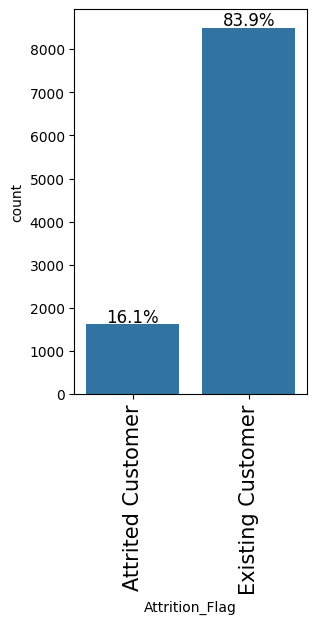

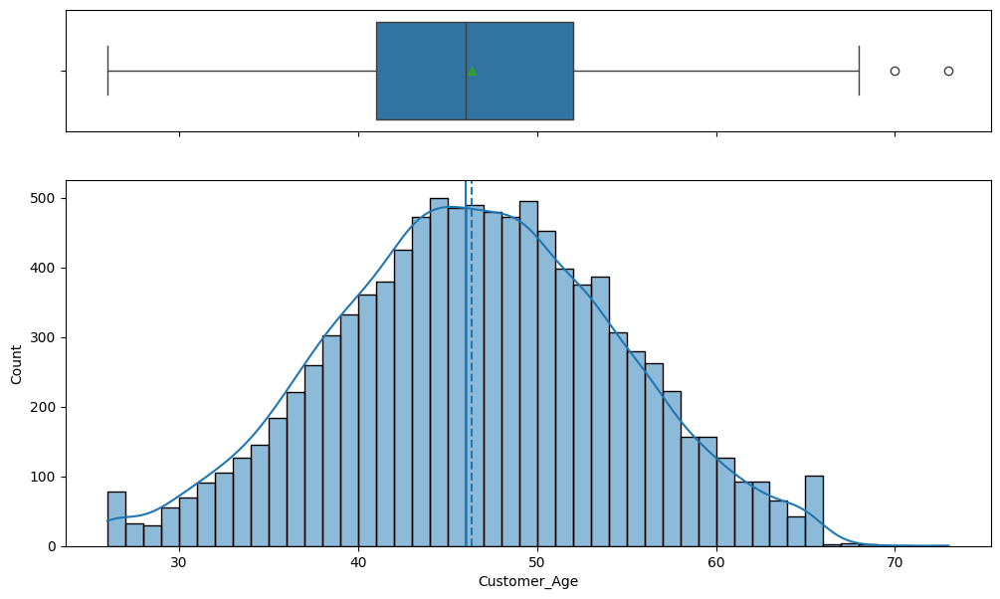

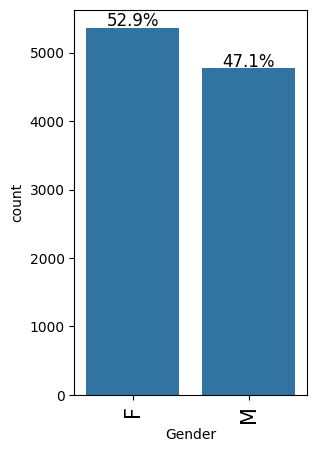

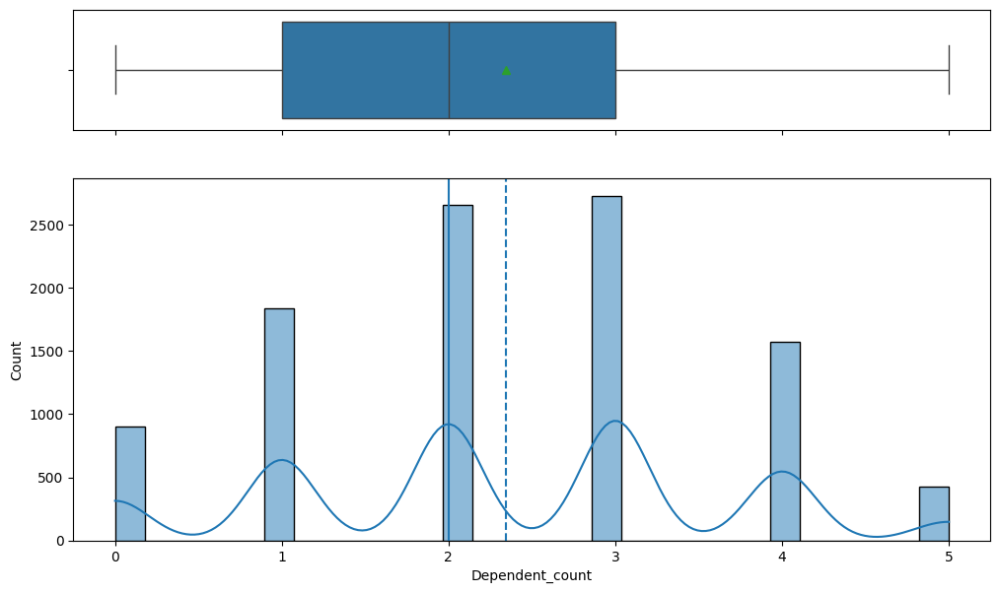

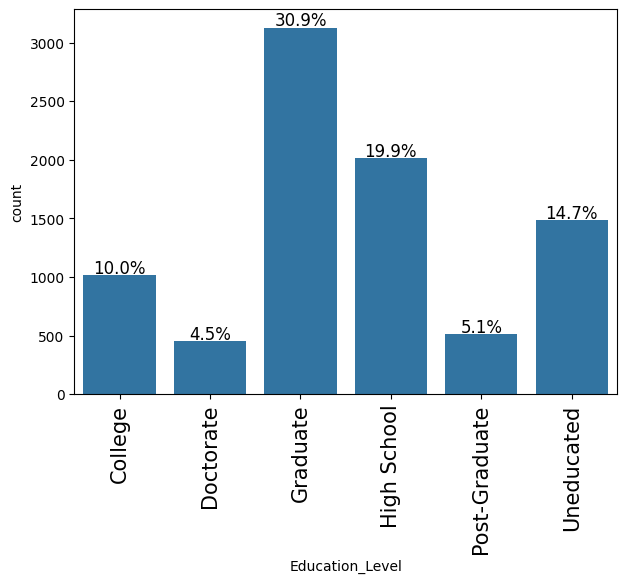

...

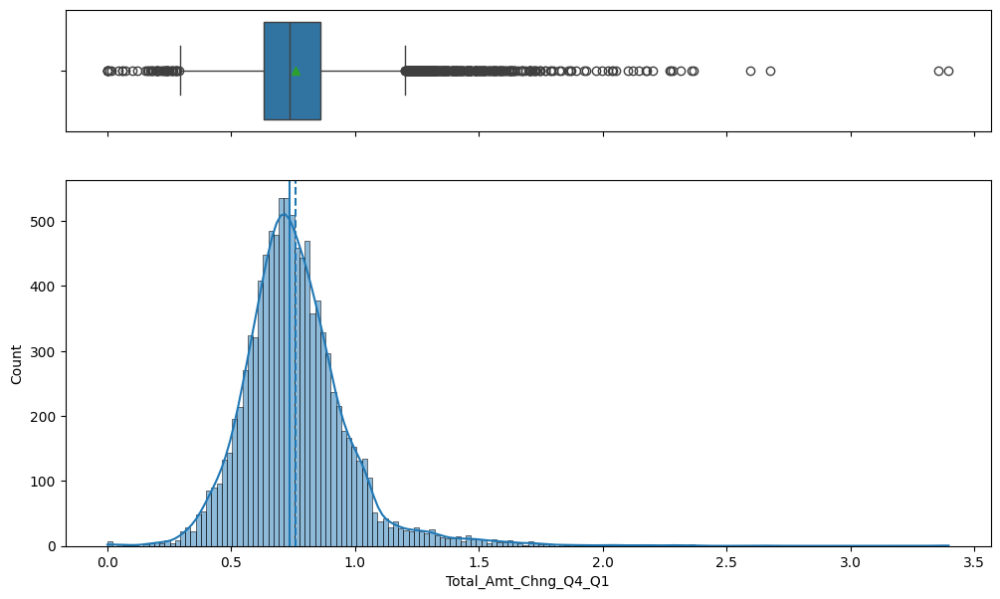

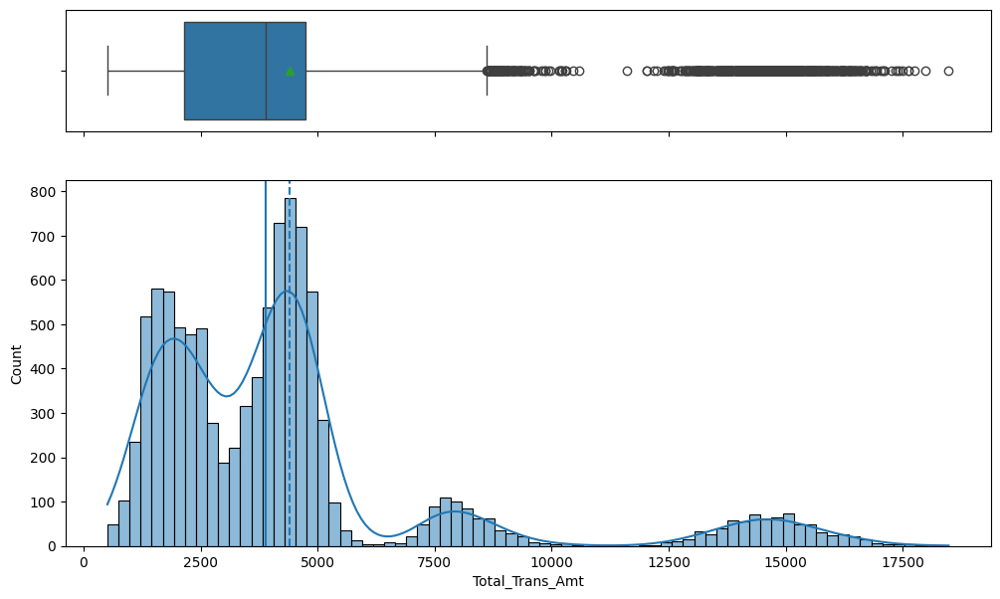

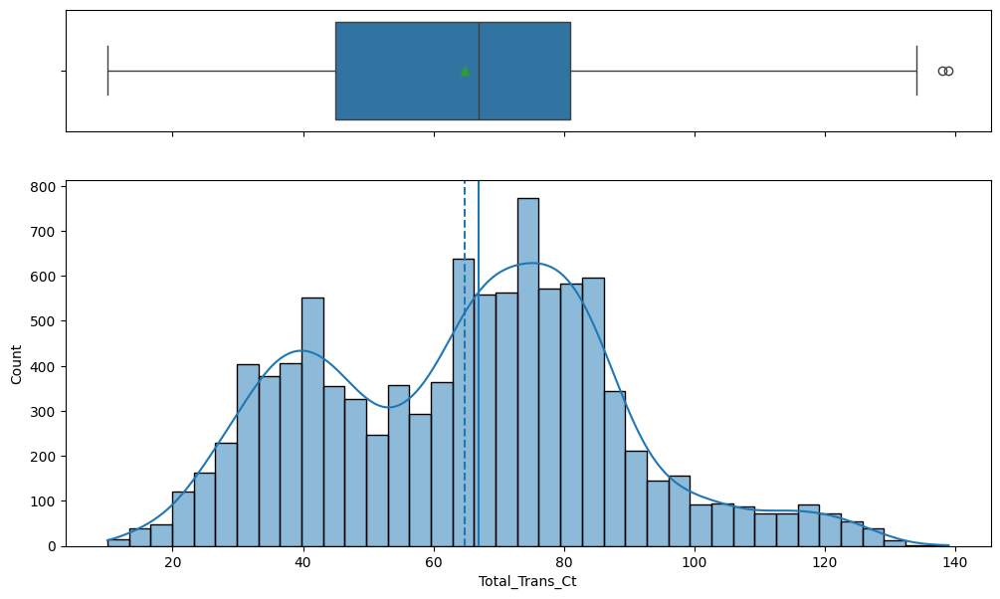

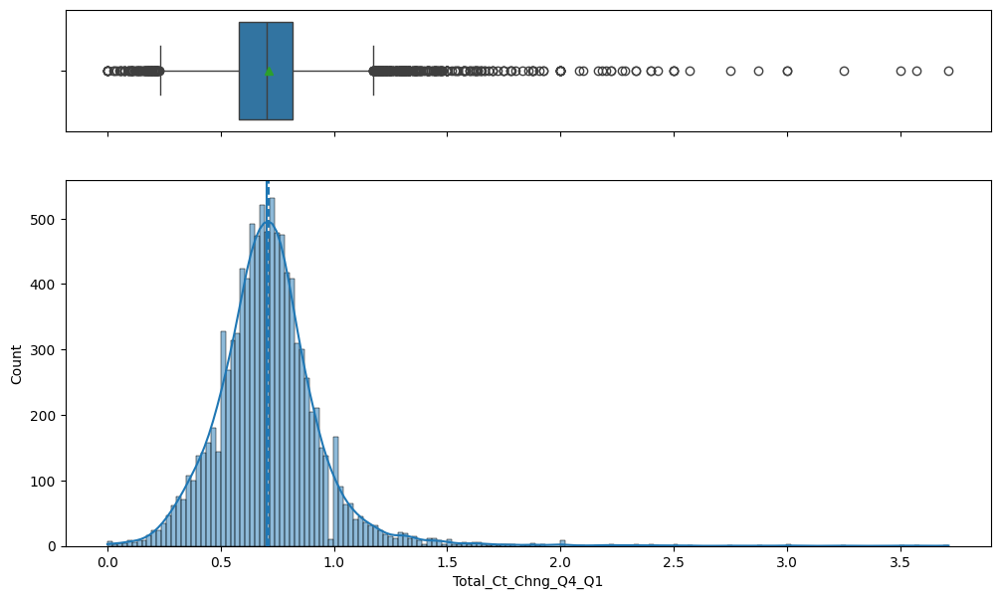

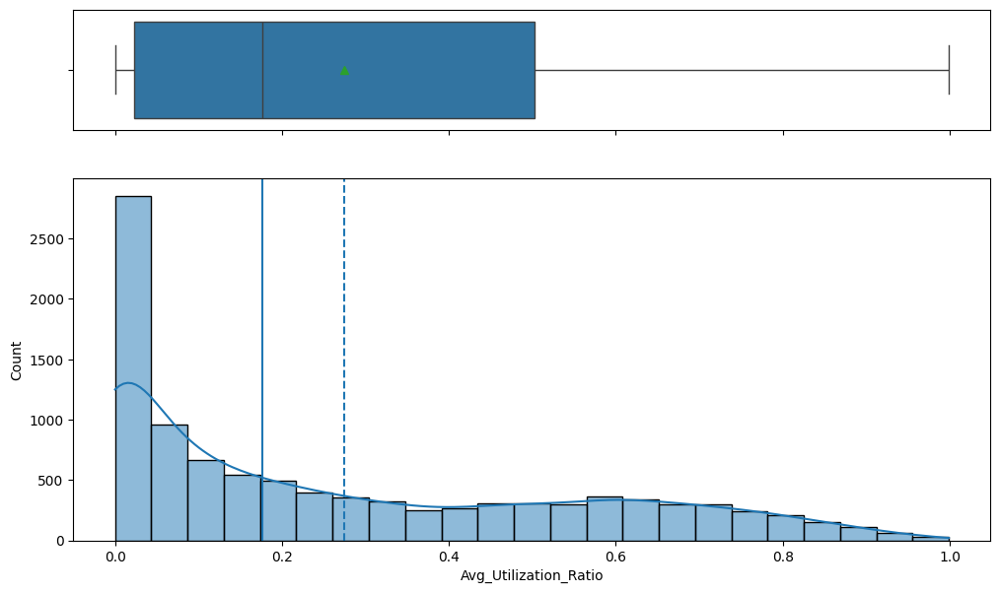

In [ ]:
edaVisuals(df, True, True)

## Data Pre-processing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
df['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', nan, 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
df['Marital_Status'].unique()

array(['Married', 'Single', nan, 'Divorced'], dtype=object)

Make copy of df dataframe

In [ ]:
df1 = df.copy()

In [ ]:

df['Income_Category'].isnull().sum()


0

In [ ]:
df['Income_Category'].value_counts()

,count
Income_Category,
Less than $40K,3561
$40K - $60K,1790
$80K - $120K,1535
$60K - $80K,1402
abc,1112
$120K +,727


#### Replacing Income_Category 'abc' with Unknown.

When deciding how to handle the value "abc", I considered two approaches: replacing it with null and then imputing a value, or replacing it with a label like "Unknown".

I chose the latter option because imputing a value could introduce artificial data and potentially skew the data towards certain income categories. Since the true value for "abc" is genuinely unknown, "Unknown" provides a more accurate representation.  

In [ ]:
# change the abc label in Income Category to unknown

df['Income_Category'].replace('abc', 'Unknown', inplace=True)


In [ ]:
# check nulls in income category

df['Income_Category'].isnull().sum()

0

In [ ]:
df['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'], dtype=object)

In [ ]:
# verify data was changed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

#### Replace Attrition_Flag Text with 0, 1

In [ ]:
# convert Attrition_Flag values replace  Existing Customer with 0 and  Attrited Customer    to 1

df['Attrition_Flag'] = df['Attrition_Flag'].replace('Existing Customer',0)
df['Attrition_Flag'] = df['Attrition_Flag'].replace('Attrited Customer',1)


#### Convert columns to type category

In [ ]:
#  convert Card_Category, Marital_Status, Income_Category, Education Level to category types

df['Card_Category'] = df['Card_Category'].astype('category')
df['Marital_Status'] = df['Marital_Status'].astype('category')
df['Income_Category'] = df['Income_Category'].astype('category')
df['Education_Level'] = df['Education_Level'].astype('category')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  object  
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

## Feature and Target Correlations and Insights

***Relationships Between Variables:***

- Strong Positive: Total transaction count and total transaction amount (0.81)  Customers who transact more tend to spend more.
- Moderate Positive: Average revolving balance and average utilization ratio (0.62) - Higher balances lead to higher utilization.
- Weak Negative: Average open to buy and average utilization ratio, Credit Limit and Avg_utilization_ratio - More available credit might lead to lower utilization.

***Customer Attrition (Churn) Analysis:***

  **Demographics:**
  - Gender: Higher churn rate among females.
  - Marital Status: Minimal impact on churn.
  - Education: Higher churn for Doctorate/Post-Graduate degrees.
  - Income: Minimal impact on churn.
  - Dependents: Minimal impact, slight increase for 3-4 dependents.
  - Age: No significant difference, slightly higher median age for churned customers.


 **Account Activity:**
  - Customer contact frequency: Positive correlation with churn. Highest churn for 4+ contacts, 100% churn for 6+ contacts. This suggests potential dissatisfaction requiring contact.
  - Number of products: Inversely related to churn. Customers with 1-3 products churn more, while those with 4-5 churn less.
  - Inactive periods: Customers with no inactive months (always active) and those inactive for 4 months have the highest churn rates. This suggests both extremes might be problematic.

**Financial Measures:**
  - Total transaction count: Lower for churned customers. There's a clear distinction between churn and transaction volume.
  - Credit Limit & Avg Revolving Balance: Slightly lower for churned customers.
  Months on Books & Avg Open-to-Buy: No significant impact on churn.


  **Card Type:**
  - Highest churn for Platinum cards. Blue cards have the second-lowest churn rate despite dominance (93.2%).


**Key Takeaways:**

This analysis highlights customer satisfaction and account activity as potential drivers of customer attrition. Further investigation is recommended for:

- Understanding Attrition by Demographics: Why do females and highly educated customers exhibit higher attrition rates?
- Analyzing Activity Extremes: Why do customers with either very high or very low account activity (always active or inactive for 4 months) have a higher propensity to leave?
- Card Type and Attrition: What factors contribute to the higher attrition rate among Platinum cardholders and the lower rate for Blue cardholders, despite their dominance?
- Customer Contact as a Dissatisfaction Signal: Does frequent customer contact indicate underlying dissatisfaction that leads to attrition?

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  object  
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

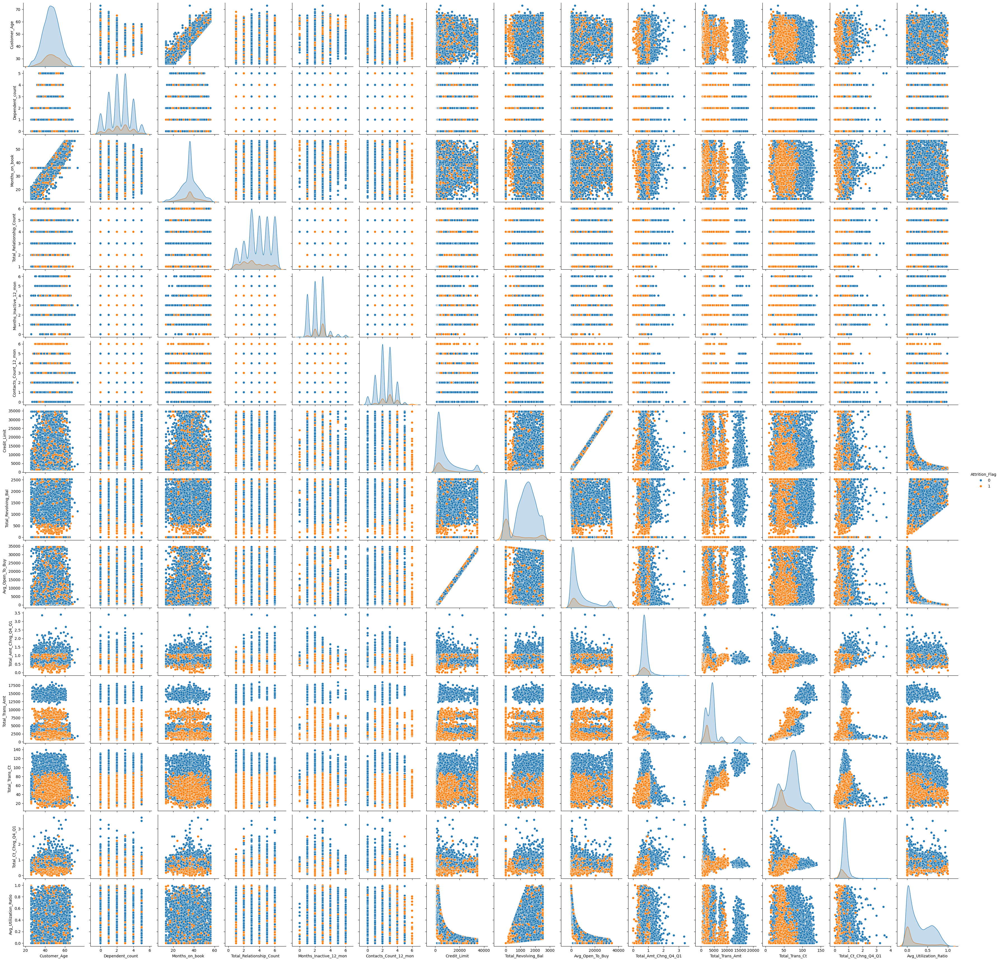

In [ ]:
# Create a pairplot with hue based on the "Attrition_Flag" column
sns.pairplot(df, hue="Attrition_Flag")

# Show the plot
plt.show()


In [ ]:
# get list of numeric columns
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

### Correlation Heat Map

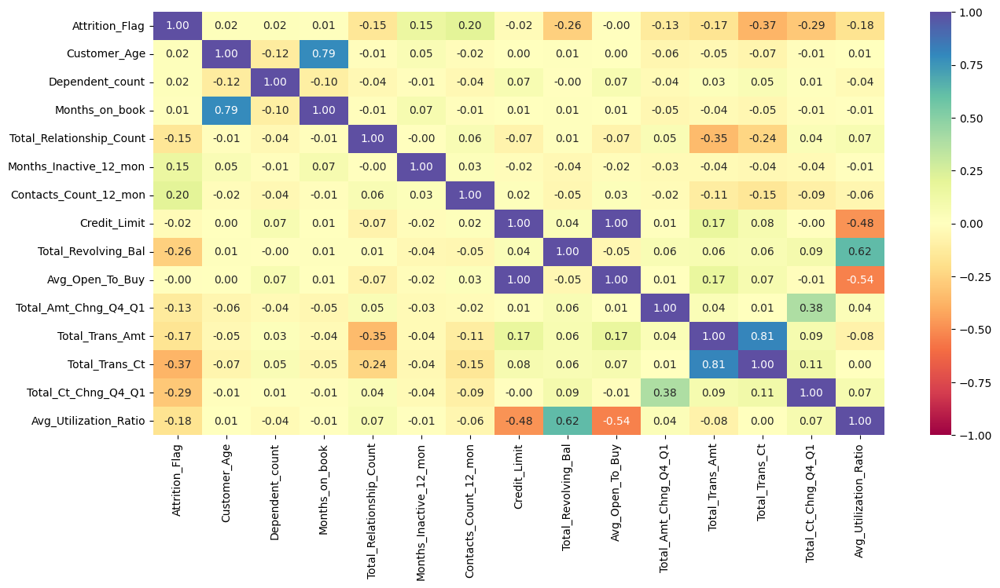

In [ ]:
# Show heatmap of dataframe to see correlations

plt.figure(figsize=(15, 7))
sns.heatmap(numeric_columns.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

- Strong Positive Correlation: Total_Trans_Ct and Total_Trans_Amt (0.81)
- Moderate Positive Correlation: Avg_revolving_balance and Avg_utilization_ratio (0.62)
- Weak Negative Correlation: Avg_open_to_buy and Avg_utilization_ratio, Credit Limit and Avg_utilization_ratio

Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


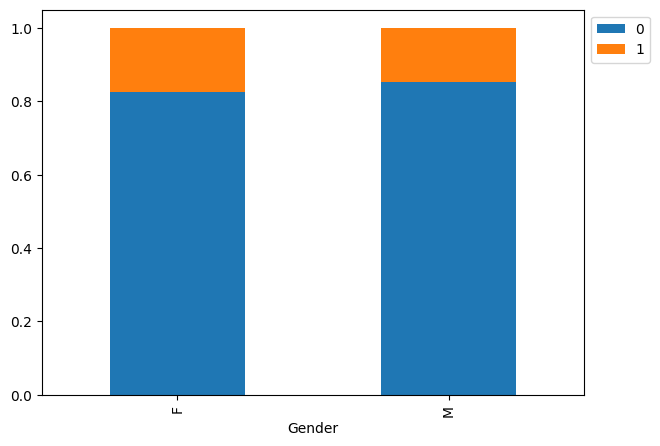

In [ ]:
# Stacked barplot - Gender and Attrition
stacked_barplot(df, "Gender", "Attrition_Flag")

Higher customer churn among females.

Attrition_Flag             0     1    All
Months_Inactive_12_mon                   
All                     8500  1627  10127
3                       3020   826   3846
2                       2777   505   3282
4                        305   130    435
1                       2133   100   2233
5                        146    32    178
6                        105    19    124
0                         14    15     29
------------------------------------------------------------------------------------------------------------------------


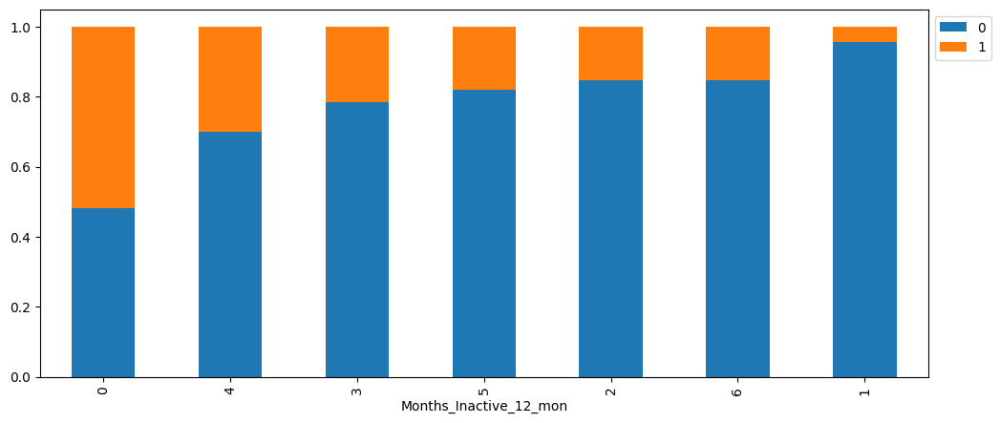

In [ ]:
stacked_barplot(df,"Months_Inactive_12_mon", "Attrition_Flag")

Customers with no inactive months (meaning they were active for all 12 months) also have a high churn rate.  This highlights that even consistently active customers might be churning.

Customers inactive for 4 months had the second-highest churn rate.

Attrition_Flag     0     1   All
Marital_Status                  
All             7880  1498  9378
Married         3978   709  4687
Single          3275   668  3943
Divorced         627   121   748
------------------------------------------------------------------------------------------------------------------------


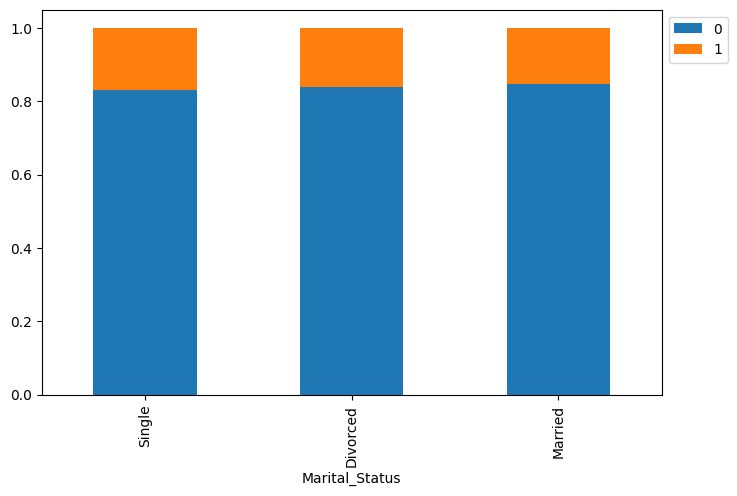

In [ ]:
# Marital Status and Attrition Flag
stacked_barplot(df,"Marital_Status", "Attrition_Flag")

Marital status shows minimal impact on churn.

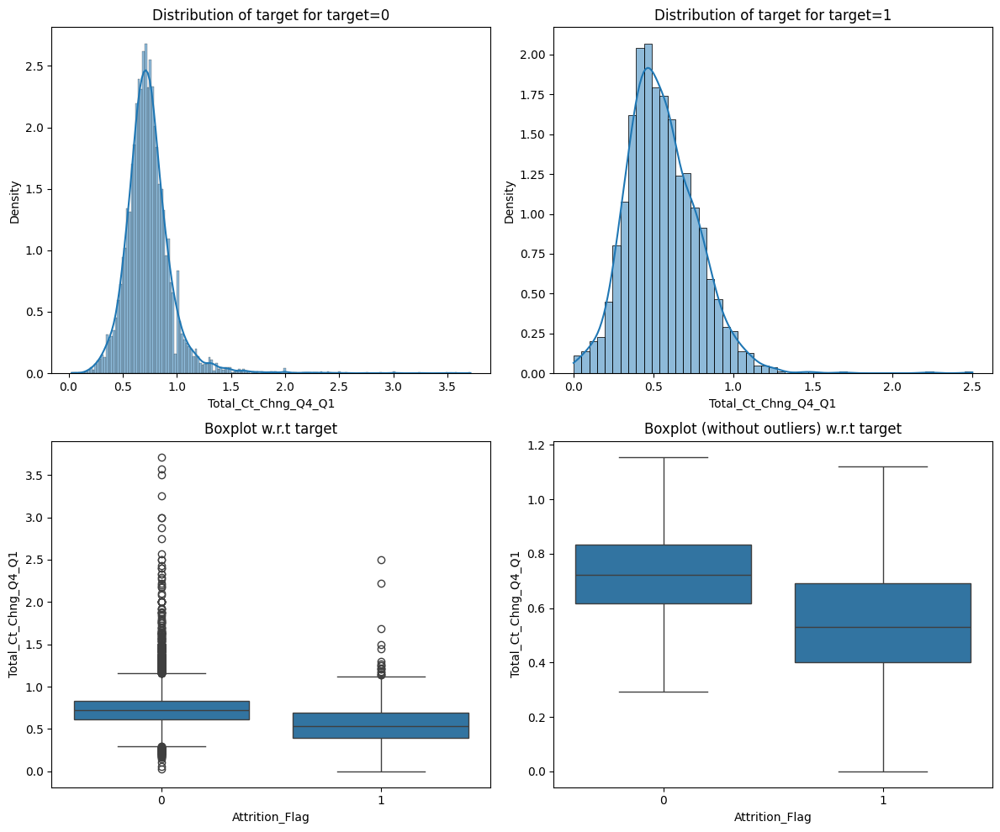

In [ ]:
distribution_plot_wrt_target(df, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag") ## Complete the code to create distribution_plot for Total_Ct_Chng_Q4_Q1 vs Attrition_Flag

Churning customers have a lower median change in total count between Q4 and Q1.

Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


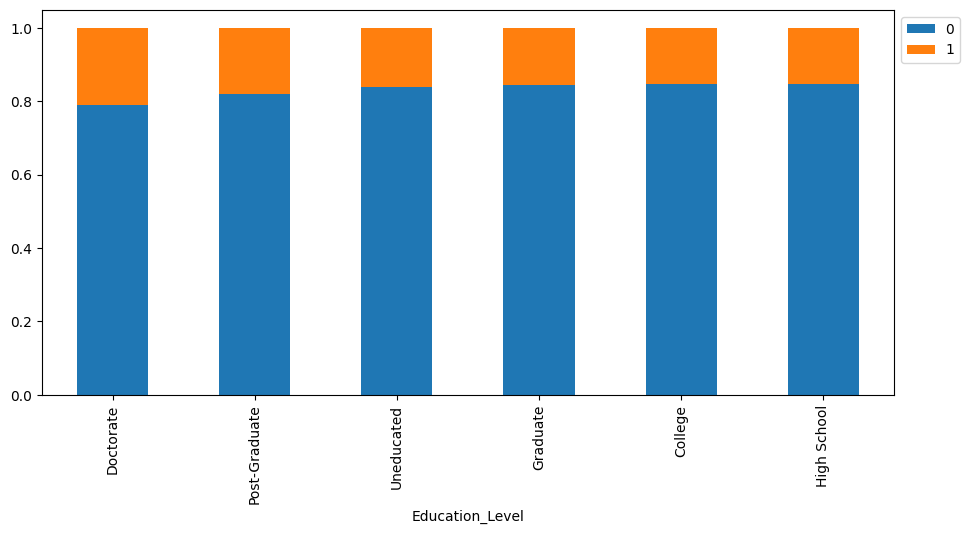

In [ ]:
# Atrrition and Education Level
stacked_barplot(df,"Education_Level", "Attrition_Flag")

Customers with Doctorate or Post-Graduate degrees show higher churn.

Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   2949   612   3561
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
Unknown           925   187   1112
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


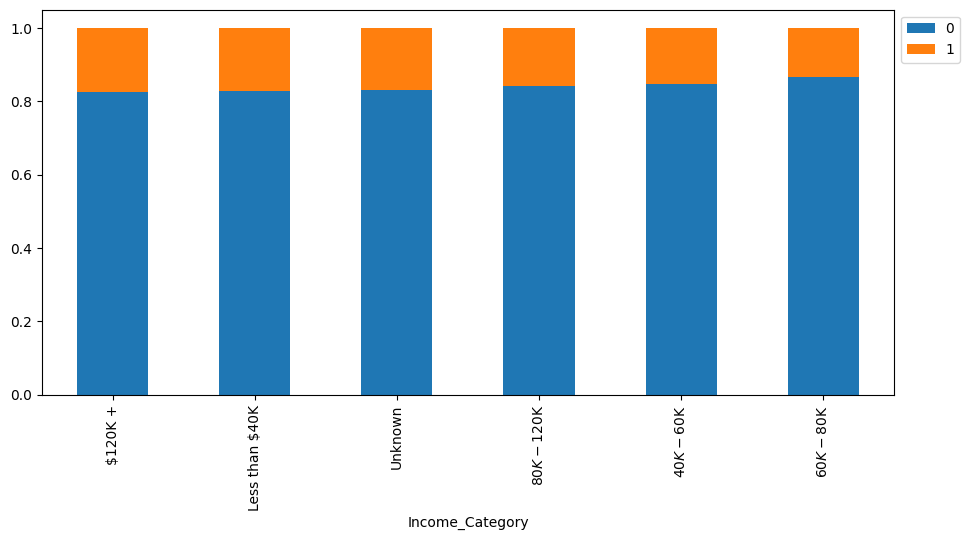

In [ ]:
# Income and Attrition

stacked_barplot(df,"Income_Category", "Attrition_Flag")

Income category shows minimal impact on churn

Attrition_Flag               0     1    All
Total_Relationship_Count                   
All                       8500  1627  10127
3                         1905   400   2305
2                          897   346   1243
1                          677   233    910
5                         1664   227   1891
4                         1687   225   1912
6                         1670   196   1866
------------------------------------------------------------------------------------------------------------------------


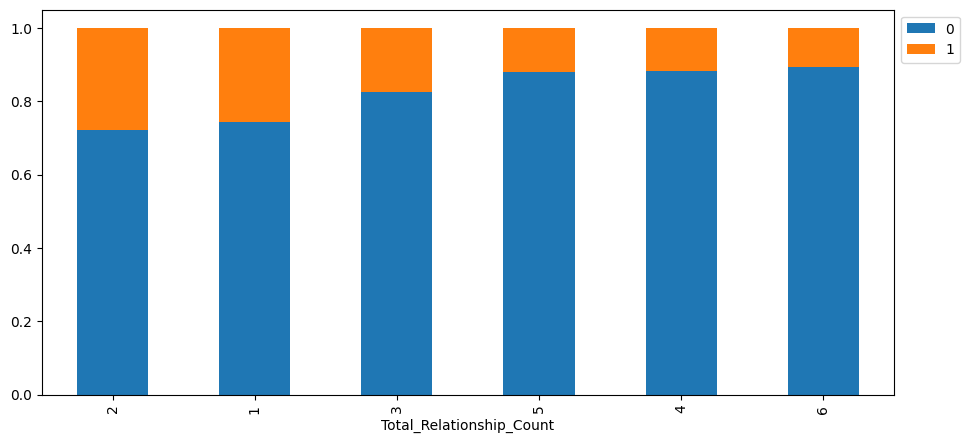

In [ ]:
# Total Relationship counts and Churn
stacked_barplot(df,"Total_Relationship_Count", "Attrition_Flag")

The number of products a customer holds (Total_Relationship_Count) is inversely related to churn. Customers with 1-3 products churn more frequently, while those with 4-5 products churn less.

Attrition_Flag            0     1    All
Contacts_Count_12_mon                   
All                    8500  1627  10127
3                      2699   681   3380
2                      2824   403   3227
4                      1077   315   1392
1                      1391   108   1499
5                       117    59    176
6                         0    54     54
0                       392     7    399
------------------------------------------------------------------------------------------------------------------------


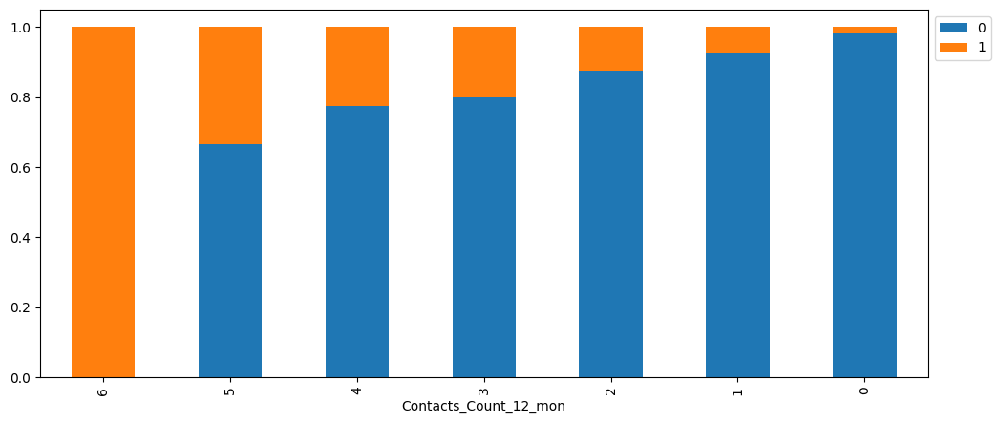

In [ ]:
# customer contacts and churn
stacked_barplot(df,"Contacts_Count_12_mon", "Attrition_Flag")

Our data suggests a positive correlation between customer contact frequency and churn. Customers who contacted the bank more frequently, especially those contacting 4 or more times, exhibited higher churn rates. Notably, 100% of customers contacting the bank at least 6 times churned.

Attrition_Flag      0     1    All
Dependent_count                   
All              8500  1627  10127
3                2250   482   2732
2                2238   417   2655
1                1569   269   1838
4                1314   260   1574
0                 769   135    904
5                 360    64    424
------------------------------------------------------------------------------------------------------------------------


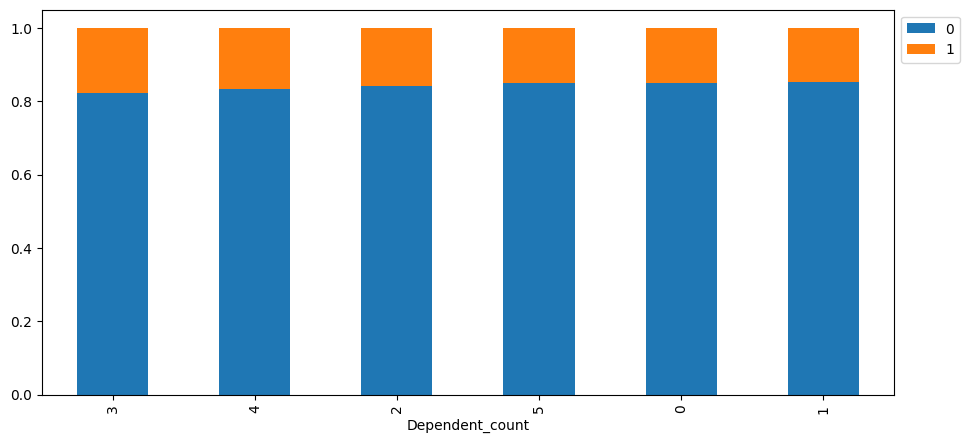

In [ ]:
# Dependant count and churn

stacked_barplot(df,"Dependent_count", "Attrition_Flag")

The number of dependents has minimal impact on churn, though there's a slight increase for customers with 3 or 4 dependents.

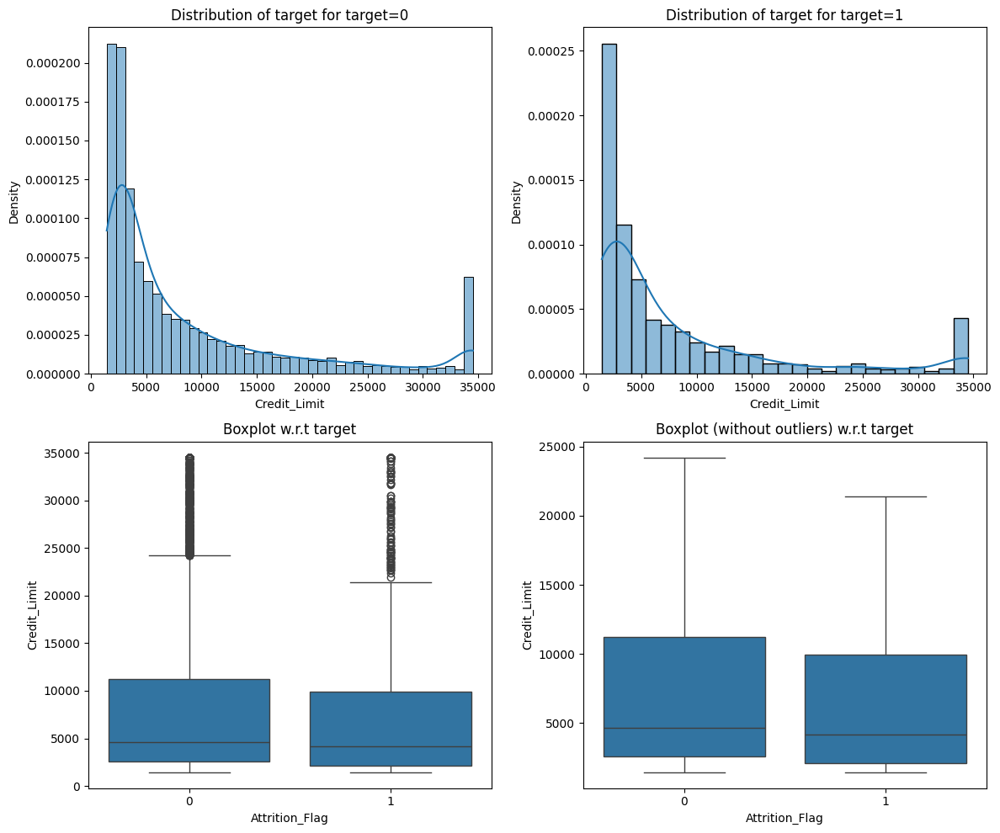

In [ ]:
# credit limit and churn

distribution_plot_wrt_target(df, "Credit_Limit", "Attrition_Flag")

Churning customers have a slightly lower median credit limit.

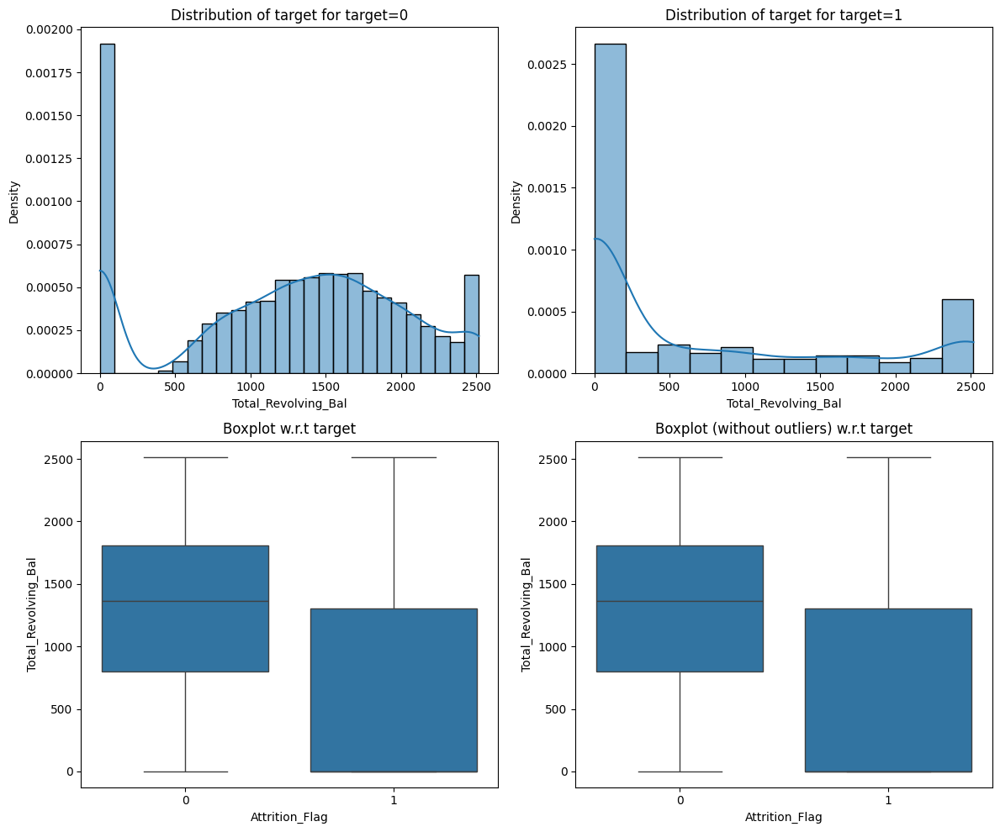

In [ ]:
# Revolving balance and churn
distribution_plot_wrt_target(df, "Total_Revolving_Bal", "Attrition_Flag")

Churning customers tend to have lower total revolving balances.

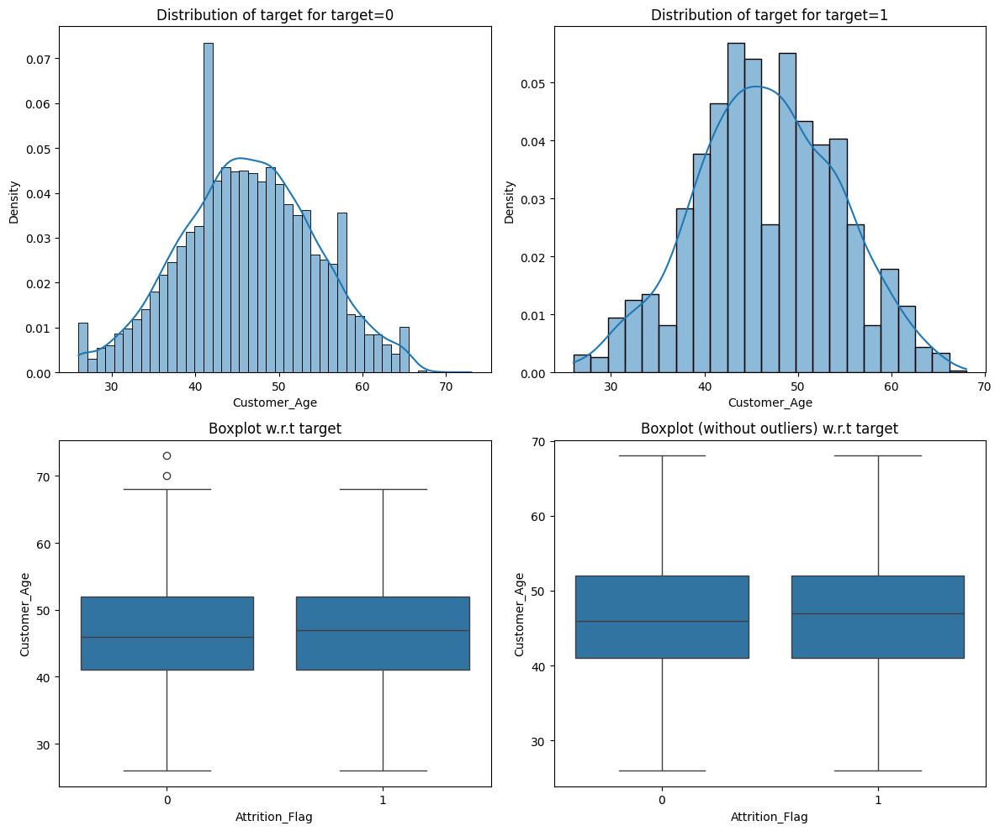

In [ ]:
# Age and Churn

distribution_plot_wrt_target(df, "Customer_Age", "Attrition_Flag")

While there's no significant difference in age distribution between churning and non-churning customers, the median age is marginally higher for those who churn.

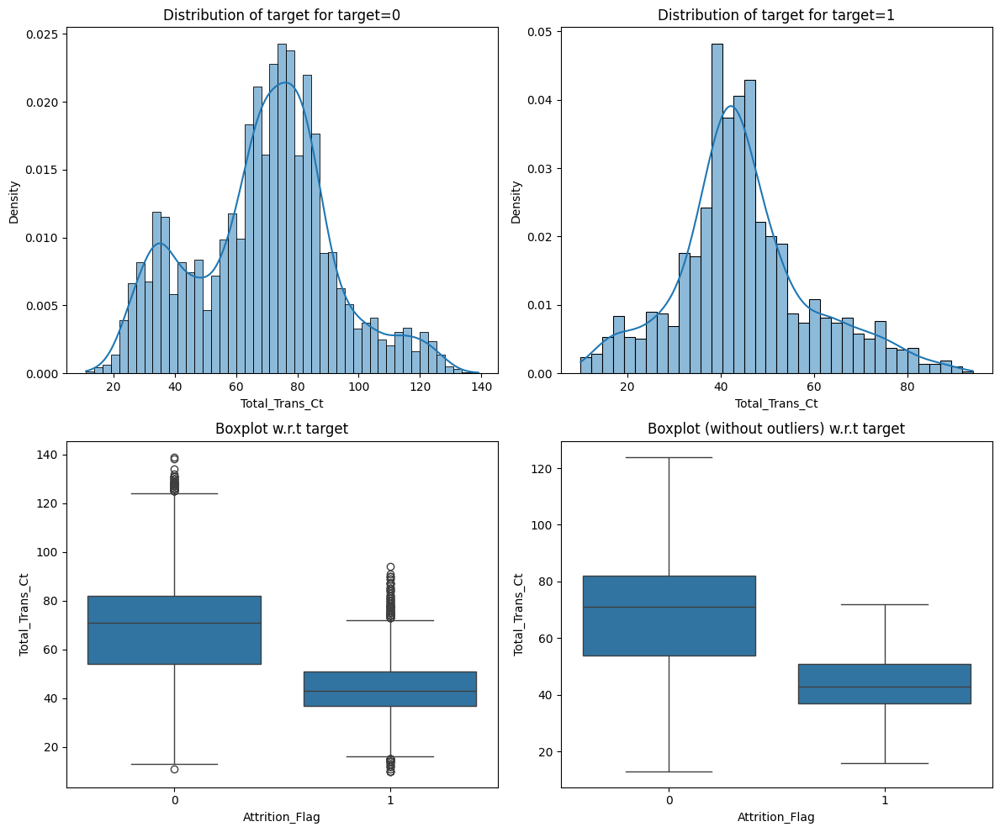

In [ ]:
#Total_Trans_Ct and Attrition
distribution_plot_wrt_target(df, "Total_Trans_Ct", "Attrition_Flag")

A clear distinction exists between customer churn and transaction volume. Customers who churn exhibit a lower total transaction count.

Attrition_Flag     0     1    All
Card_Category                    
All             8500  1627  10127
Blue            7917  1519   9436
Silver           473    82    555
Gold              95    21    116
Platinum          15     5     20
------------------------------------------------------------------------------------------------------------------------


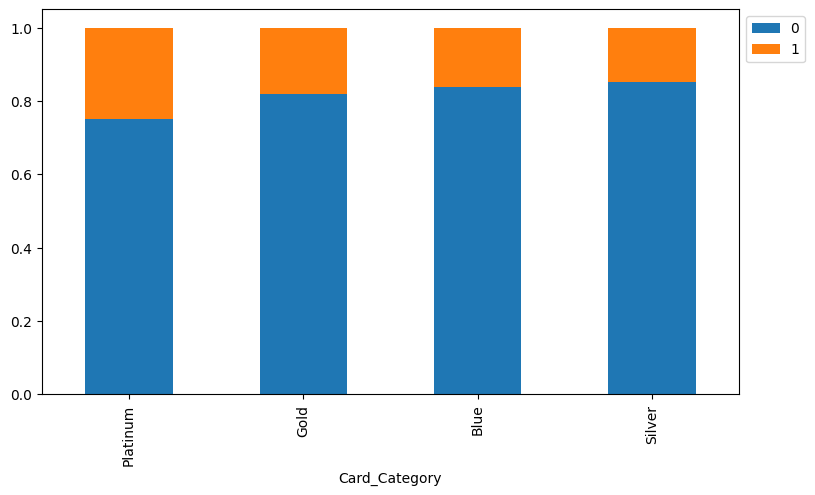

In [ ]:
# card categirt and attrition
stacked_barplot(df,"Card_Category", "Attrition_Flag")

Customer churn is highest among Platinum cardholders compared to other card types. Interestingly, Blue cards have the second-lowest churn rate, even though they represent a dominant 93.2% of the customer base.

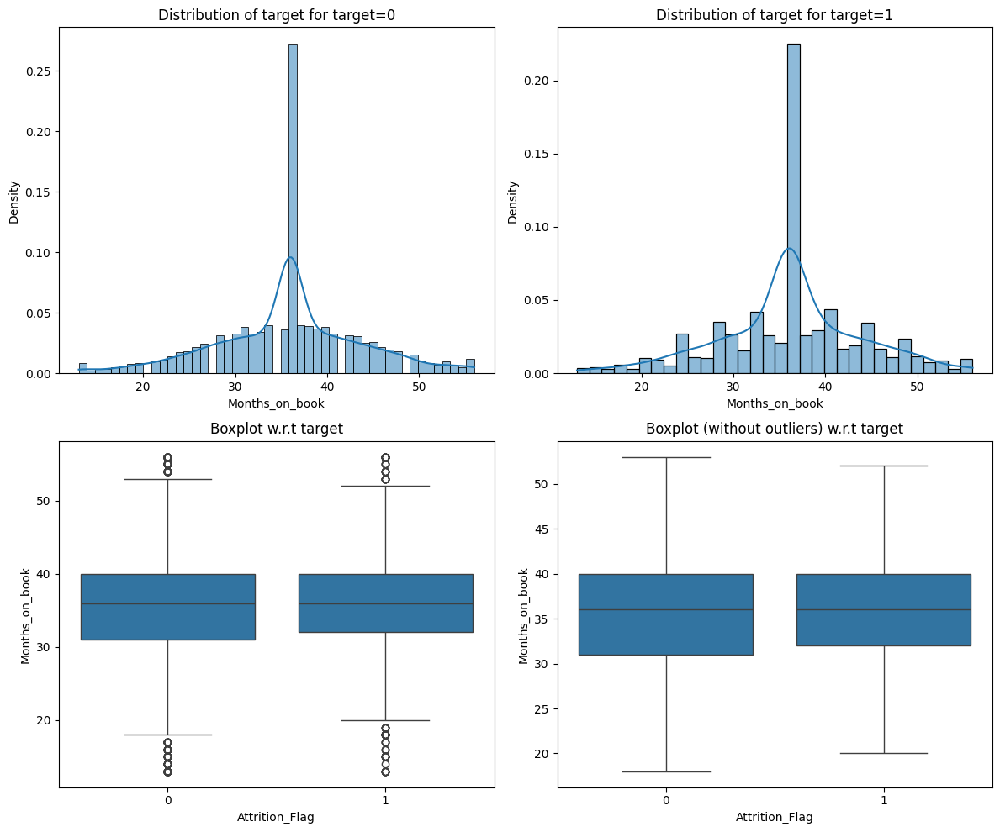

In [ ]:
# Months_on_book and attrition
distribution_plot_wrt_target(df, "Months_on_book", "Attrition_Flag")


No notable difference found in Months on books and attrition

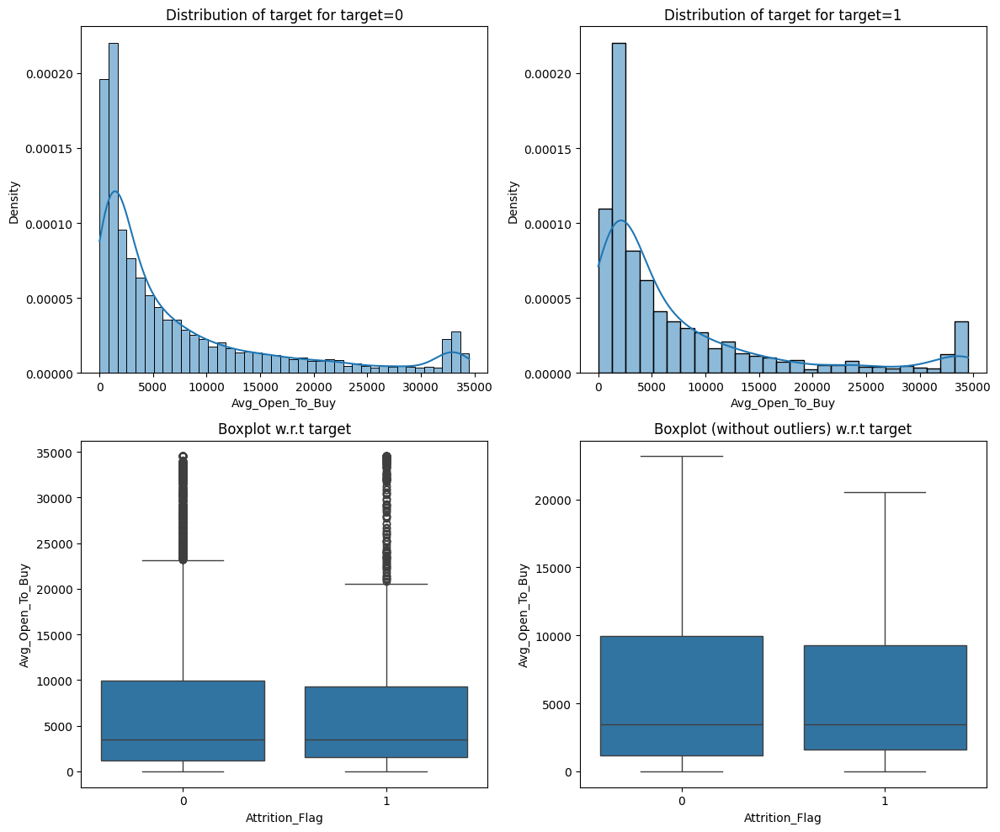

In [ ]:
# Avg_Open_To_Buy and attrition
distribution_plot_wrt_target(df, "Avg_Open_To_Buy", "Attrition_Flag")


Avg_Open-To-Buy doesn't seem to have an impact on customer churn (attrition).

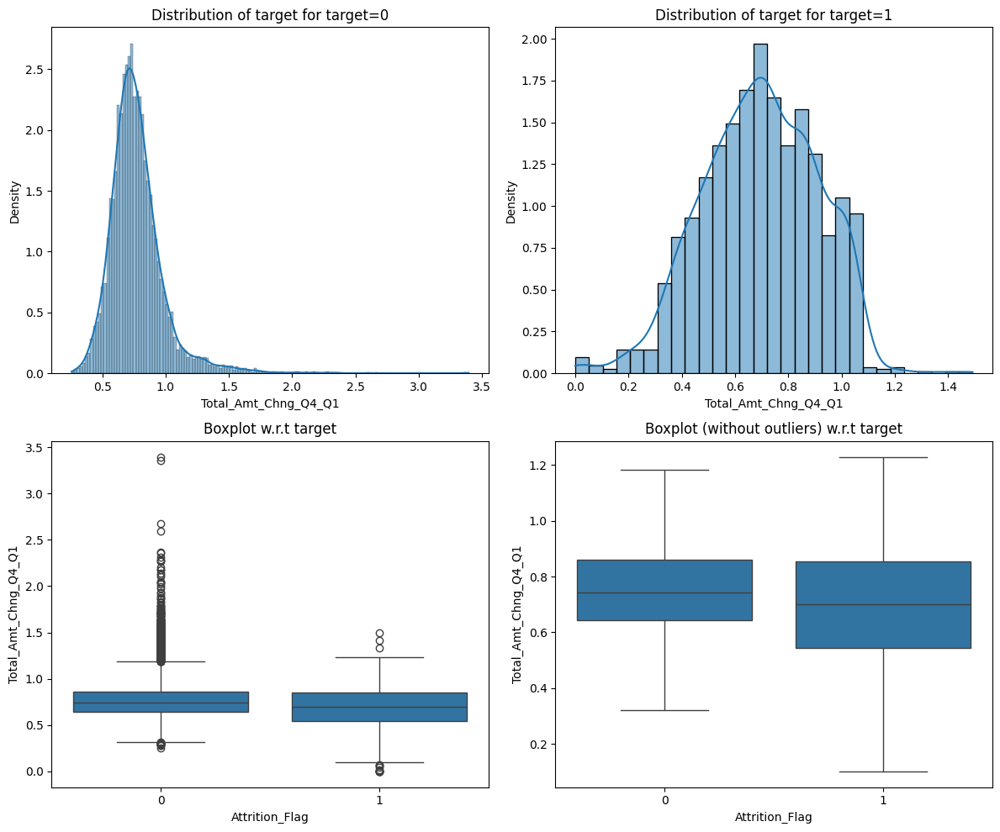

In [ ]:
# Total_Amt_Chng_Q4_Q1 and Attrition
distribution_plot_wrt_target(df, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")


Total_Amt_Chng_Q4_Q1 is only slightly lower for customers that Attrited

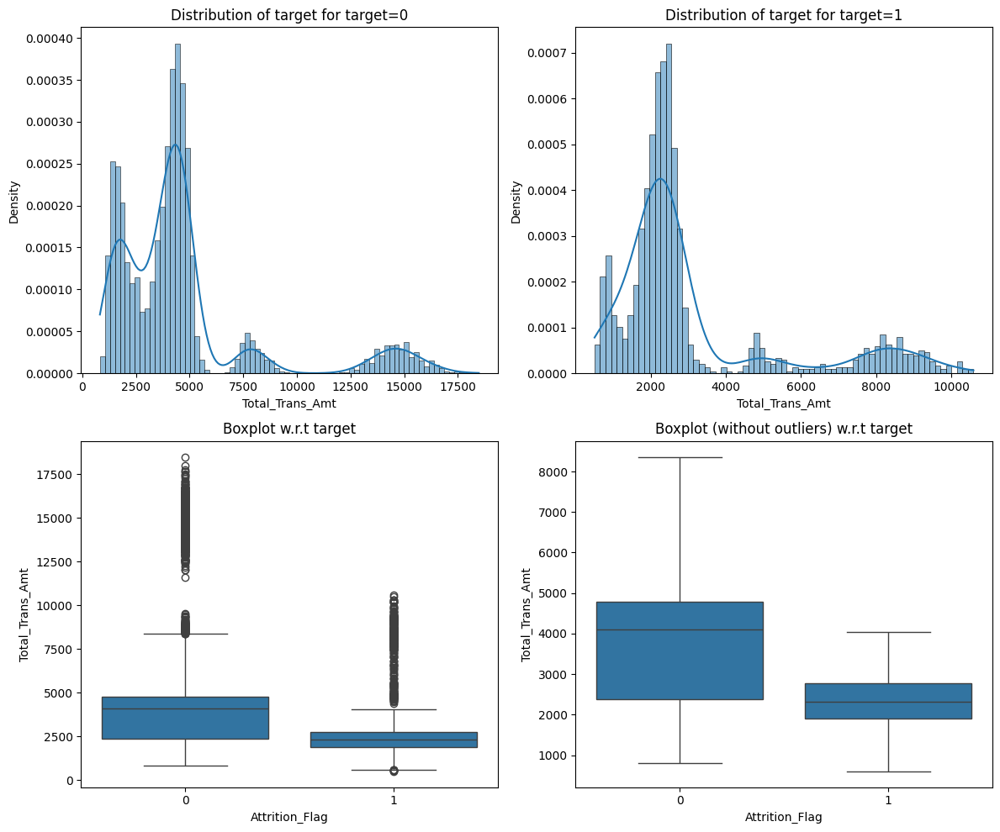

In [ ]:
# Total_Trans_Amt and Attrition
distribution_plot_wrt_target(df, "Total_Trans_Amt", "Attrition_Flag")

Total Trans Amount is slightly lower for customers that churned.

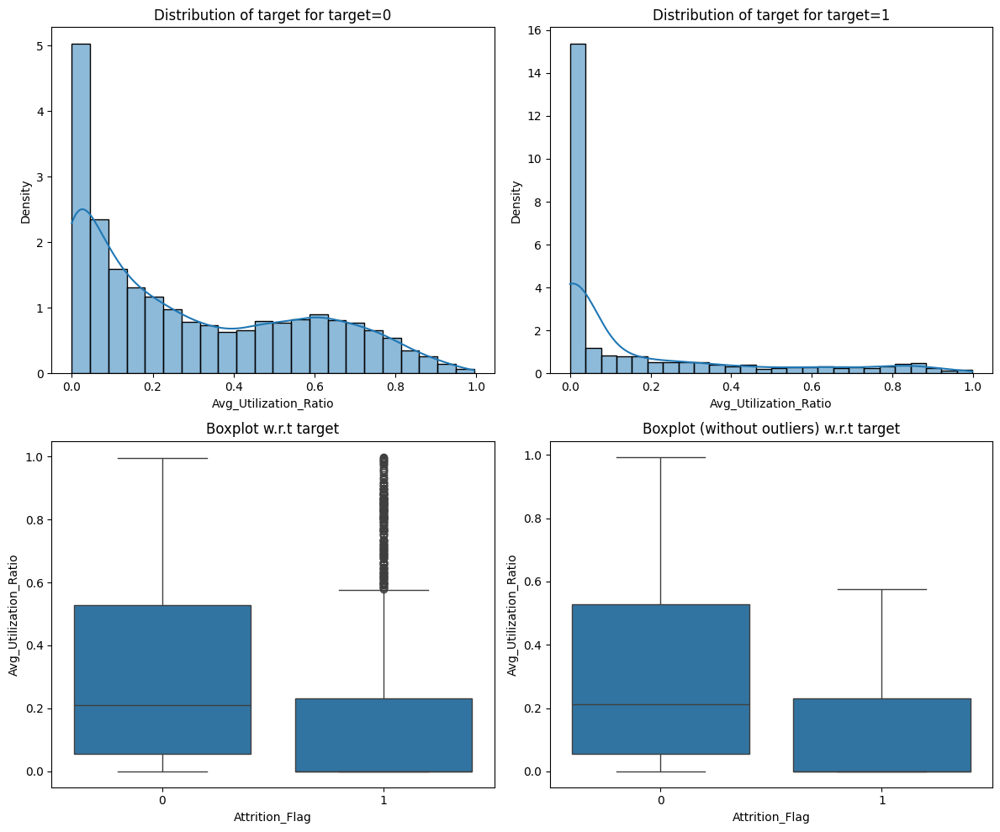

In [ ]:
# Avg_Utilization_Ratio and Attrition
distribution_plot_wrt_target(df, "Avg_Utilization_Ratio", "Attrition_Flag")

Avg_Utilization_Ratio is slightly lower for customers that churned

In [ ]:
# verify data was changed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  int64   
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  object  
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

## Outlier Detection



Outliers are present in several of the columns, however we will not treat them as the data is valid.  

In [ ]:
# Get 25th percentile
Q1 = df.select_dtypes(include=["float64", "int64"]).quantile(0.25)
# Get the 75th percentile
Q3 = df.select_dtypes(include=["float64", "int64"]).quantile(0.75)

# Calculate the IQR
IQR = Q3 - Q1

# calculate lower and upper bounds for all values
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)

In [ ]:
# checking the % outliers for numerical columns
((df.select_dtypes(include=["float64", "int64"]) < lower) | (df.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(df) * 100

,0
Attrition_Flag,16.066
Customer_Age,0.020
Dependent_count,0.000
Months_on_book,3.812
Total_Relationship_Count,0.000
Months_Inactive_12_mon,3.268
Contacts_Count_12_mon,6.211
Credit_Limit,9.717
Total_Revolving_Bal,0.000
Avg_Open_To_Buy,9.509


In [ ]:
# copy dataframe
df_model = df.copy()

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True Positive (TP) - Predict customer will Attrite, and did Attrite
- False Negative (FN) - Predicted customer would not Attribute, but did Atrrite
- False Postive (FP) - Precited Customer woudl attrite but did not Attrite
- True Negative (TN) - Predicted customer would not attrite and the did not Attrite


**Which metric to optimize?**

* We want to minimize false negatives in this case.  If we predict a customer will not Attrite and they do, the bank has lost a valuable customer.   Our metric for this case is Recall.  



**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Spliting the Dataset

Setting X and y variables before splitting the data

In [ ]:
# Making backup copy of df_model
df_modelbu = df_model.copy()

In [ ]:
# Set features to X and target to y

X = df_model.drop(["Attrition_Flag"], axis=1)
y = df_model["Attrition_Flag"]

### Spliting data into training and validation sets

In [ ]:
# Splitting data into training, validation and test set:

# first we split data into 2 parts, say train and temp
# assigning training dataset 60% of total dataset
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1, stratify=y
)

# then we split the temp set into val and test, spliting 50/50
# val and test now have 20% of tatl data set
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp
)

print(X_train.shape, X_val.shape, X_test.shape)

(6076, 19) (2025, 19) (2026, 19)


### Impute Missing Values

In [ ]:
# Imputing Missing values in Education Level and Marital Status

imp_mode = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
cols_to_impute = ["Education_Level", "Marital_Status"]

# fit and transform the imputer on train data
X_train[cols_to_impute] = imp_mode.fit_transform(X_train[cols_to_impute])

# Transform on validation and test data
X_val[cols_to_impute] = imp_mode.transform(X_val[cols_to_impute])

# fit and transform the imputer on test data
X_test[cols_to_impute] = imp_mode.transform(X_test[cols_to_impute])

In [ ]:
#checking for nulls in the split datasets

print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

In [ ]:
# Get Dummy variables for all datasets

X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)

print(X_train.shape, X_val.shape, X_test.shape)

(6076, 30) (2025, 30) (2026, 30)


## Model Building with original data

In [ ]:
# Creating Bagging, Random Forest, AdaBoost, Gradient Boost and XGBoost models

# initialize a list to hold all model scores
models = []

# Define Scoring Data Frames for Train and Validation datasets

orgTrainAllScores = pd.DataFrame()
orgValAllScores = pd.DataFrame()


# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("GradientBoost", GradientBoostingClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1, verbosity = 0)))
models.append(("Decision Tree", DecisionTreeClassifier(random_state=1)))




# Loop to populate display training scores and to populate orgTrainAllScores dataframe

#print("\n" "Training Performance:" "\n")
for  name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("Training {}: {}".format(name, scores))
    df1 = pd.DataFrame({'Model': [name]})
    df2 = model_performance_classification_sklearn(model, X_train, y_train)
    tempdf = pd.concat([df1, df2], axis=1)
    orgTrainAllScores = pd.concat([orgTrainAllScores, tempdf], axis=0, ignore_index=True)

    scores_val = recall_score(y_val, model.predict(X_val))
    print("Validation {}: {}".format(name, scores_val))
    df3 = pd.DataFrame({'Model': [name]})
    df4 = model_performance_classification_sklearn(model, X_val, y_val)
    tempdfval = pd.concat([df3, df4], axis=1)
    orgValAllScores = pd.concat([orgValAllScores, tempdfval], axis=0, ignore_index=True)


Training Bagging: 0.9836065573770492
Validation Bagging: 0.8338461538461538
Training Random forest: 1.0
Validation Random forest: 0.7723076923076924
Training AdaBoost: 0.8493852459016393
Validation AdaBoost: 0.84
Training GradientBoost: 0.8872950819672131
Validation GradientBoost: 0.8646153846153846
Training XGBoost: 1.0
Validation XGBoost: 0.9107692307692308
Training Decision Tree: 1.0
Validation Decision Tree: 0.8307692307692308


Random Forest, XGBoost and Bagging have the highest recall scores on trianng data.

XGBoost and AdaBoost have the highest recall values on the validation dataset.

Creating a Datafame that shows differenced btwn models recall scores

In [ ]:
#  Function that returns concatenated dataframe with selected metrics


def classificationResultsDF(modelSuffix, trainResultsDF, testResultsDF, metricList):
  orgModelScoreDiff = pd.DataFrame()
  orgModelScoreDiff['Model'] = trainResultsDF['Model'] + modelSuffix
  for metric in metricList:
    if metric == "Recall":
      orgModelScoreDiff['Recall Train'] = trainResultsDF['Recall']
      orgModelScoreDiff['Recall Val'] = testResultsDF['Recall']
      orgModelScoreDiff['Recall_Diff'] = trainResultsDF['Recall'] - testResultsDF['Recall']
    elif metric == "Accuracy":
      orgModelScoreDiff['Accuracy Train'] = trainResultsDF['Accuracy']
      orgModelScoreDiff['Accuracy Val'] = testResultsDF['Accuracy']
      orgModelScoreDiff['Accuracy Diff'] =trainResultsDF['Accuracy'] -testResultsDF['Accuracy']
    elif metric == "Precision":
      orgModelScoreDiff['Precision Train'] = trainResultsDF['Precision']
      orgModelScoreDiff['Precision Val'] = testResultsDF['Precision']
      orgModelScoreDiff['Precision Diff'] =trainResultsDF['Precision'] -testResultsDF['Precision']
    elif metric == "F1":
      orgModelScoreDiff['F1 Train'] = trainResultsDF['F1']
      orgModelScoreDiff['F1 Val'] = testResultsDF['F1']
      orgModelScoreDiff['F1 Diff'] =trainResultsDF['F1'] -testResultsDF['F1']
      orgModelScoreDiff.sort_values(by='Recall_Diff', ascending=True).reset_index(drop=True)

  return orgModelScoreDiff

###Combined Metrics for Models using Original Dataset

In [ ]:
# metricList = ["Accuracy", "Precision", "Recall", "F1"]

orgModelScoreDiff = classificationResultsDF("_org", orgTrainAllScores, orgValAllScores, metricList = ["Recall", "F1"])


In [ ]:
orgModelScoreDiff.sort_values(by='Recall_Diff', ascending=True)

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
2,AdaBoost_org,0.849,0.840,0.009,0.876,0.867,0.009
3,GradientBoost_org,0.887,0.865,0.023,0.923,0.896,0.026
4,XGBoost_org,1.000,0.911,0.089,1.000,0.924,0.076
0,Bagging_org,0.984,0.834,0.150,0.990,0.860,0.129
5,Decision Tree_org,1.000,0.831,0.169,1.000,0.818,0.182
1,Random forest_org,1.000,0.772,0.228,1.000,0.849,0.151


### **<a name="adaorg">Original Dataset Summary</a>**

Based on the validation scores, the best model is AdaBoost.  AdaBoost offers a good balance between training (0.85) and validation scores(0.84), suggesting it might generalize better to unseen data.

- Gradient Boosting also performed well on bost test and validation scores, 0.887 and 0.865 respectively.  

- XGBoost: Achieved a high training score (1.0) but has a lower validation score (0.91) compared to AdaBoost. This suggests potential overfitting on the training data.

- Bagging: Both suffer from a similar issue as XGBoost - high training scores (around 0.98) but lower recall scores on the validation dataset (around 0.83).

- Random Forest: Achieved a perfect training score (1.0) but has the lowest recall score (0.77) among all models, indicating significant overfitting.

- Decision Tree:  Achieved a perfect training score (1.0) bas a recall of 0.83, indicating significant overfitting.  

## Model Building with Oversampled data


In [ ]:
# Synthetic Minority Over Sampling Technique
# Use X_train and y_train to create over sampled dataset

sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 976
Before OverSampling, count of label '0': 5100 

After OverSampling, count of label '1': 5100
After OverSampling, count of label '0': 5100 

After OverSampling, the shape of train_X: (10200, 30)
After OverSampling, the shape of train_y: (10200,) 



In [ ]:
# Loop through 5 models using the over sampled dataset

# Empty list to store all the models
modelsOver = []

#overTrain = pd.DataFrame(columns=["Model_Over_Train", "Score"])
#overVal = pd.DataFrame(columns=["Model_Over_Val", "Score"])

overTrainScores = pd.DataFrame()
overValScores = pd.DataFrame()

# Appending models into the list
modelsOver.append(("Bagging", BaggingClassifier(random_state=1)))
modelsOver.append(("Random forest", RandomForestClassifier(random_state=1)))
modelsOver.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
modelsOver.append(("GradientBoost", GradientBoostingClassifier(random_state=1)))
modelsOver.append(("XGBoost", XGBClassifier(random_state=1, verbosity = 0)))
modelsOver.append(("Decision Tree", DecisionTreeClassifier(random_state=1)))

for  name, model in modelsOver:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("Training {}: {}".format(name, scores))
    df1 = pd.DataFrame({'Model': [name]})
    df2 = model_performance_classification_sklearn(model, X_train_over, y_train_over)
    tempdf = pd.concat([df1, df2], axis=1)
    overTrainScores = pd.concat([overTrainScores, tempdf], axis=0, ignore_index=True)

    scores_val = recall_score(y_val, model.predict(X_val))
    print("Validation {}: {}".format(name, scores_val))
    df3 = pd.DataFrame({'Model': [name]})
    df4 = model_performance_classification_sklearn(model, X_val, y_val)
    tempdfval = pd.concat([df3, df4], axis=1)
    overValScores = pd.concat([overValScores, tempdfval], axis=0, ignore_index=True)


Training Bagging: 0.9968627450980392
Validation Bagging: 0.8830769230769231
Training Random forest: 1.0
Validation Random forest: 0.8523076923076923
Training AdaBoost: 0.9664705882352941
Validation AdaBoost: 0.8861538461538462
Training GradientBoost: 0.9801960784313726
Validation GradientBoost: 0.9076923076923077
Training XGBoost: 1.0
Validation XGBoost: 0.9107692307692308
Training Decision Tree: 1.0
Validation Decision Tree: 0.8615384615384616


Gradient Boost and XGBoost have the highest Recall scores on the validation dataset

### Combined Metrics for Models using Over Sampled Dataset

In [ ]:
# metricList = ["Accuracy", "Precision", "Recall", "F1"]

overModelScoreDiff = classificationResultsDF("_over", overTrainScores, overValScores, metricList = ["Recall", "F1"])
overModelScoreDiff

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Bagging_over,0.997,0.883,0.114,0.997,0.838,0.159
1,Random forest_over,1.000,0.852,0.148,1.000,0.862,0.138
2,AdaBoost_over,0.966,0.886,0.080,0.962,0.816,0.146
3,GradientBoost_over,0.980,0.908,0.073,0.977,0.861,0.116
4,XGBoost_over,1.000,0.911,0.089,1.000,0.909,0.091
5,Decision Tree_over,1.000,0.862,0.138,1.000,0.795,0.205


In [ ]:
overModelScoreDiff

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Bagging_over,0.997,0.883,0.114,0.997,0.838,0.159
1,Random forest_over,1.000,0.852,0.148,1.000,0.862,0.138
2,AdaBoost_over,0.966,0.886,0.080,0.962,0.816,0.146
3,GradientBoost_over,0.980,0.908,0.073,0.977,0.861,0.116
4,XGBoost_over,1.000,0.911,0.089,1.000,0.909,0.091
5,Decision Tree_over,1.000,0.862,0.138,1.000,0.795,0.205


### **Over Sampling Summmary**
Overall, over sampling improved the Recall scores for all models.  

Based on the validation scores, the best model is Gradient Boosting with a training score of 0.98 validation score of 0.91.

Ada Boost also had a high training recall of 0.97 however the recall score on validation data was 0.89, suggesting Gradient Boost might generalize better to unseen data.  

**Bagging:**
- Oversampling improved the Bagging training recall significantly: This suggests the model is learning the patterns related to the positive class (recall) very well on the oversampled data.
- Oversampling offered a moderate improvement in validation recall: While it helped, the validation recall is still lower than the training recall, indicating potential overfitting.

**Random Forest:**
- Training Recall: Both the original and oversampled models achieved a perfect training recall of 1.0.
- Validation Recall: Oversampling led to a moderate improvement in validation recall (from 0.772 to 0.852).

**Ada Boost:**
- Training Recall: Oversampling led to a significant improvement in training recall (0.966 vs 0.849). This suggests the model learned the patterns related to the positive class (recall) much better on the oversampled data.
- Validation Recall: There's a slight improvement in validation recall with oversampling (0.886 vs 0.84). However, the gap between training and validation recall remains significant for both original and oversampled data.

**Gradient Boost:**
- Training Recall: Oversampling led to a substantial increase in training recall (0.980 vs. 0.887). This indicates the model learned the patterns related to the positive class (recall) significantly better on the oversampled data.
- Validation Recall: There's a moderate improvement in validation recall with oversampling (0.908 vs. 0.865). However, a gap between training and validation recall persists for both datasets

**Decision Tree:**
- Training Recall: Both the original and oversampled models achieved a perfect training recall of 1.0. This indicates the models are classifying all positive examples correctly on the training data.
- Validation Recall: Oversampling led to a slight improvement in validation recall (from 0.83 to 0.86).
- While oversampling resulted in a small improvement in validation recall, it didn't significantly change the overall pattern.

**XG Boost:**
- Training Recall: Both the original and oversampled models achieved a perfect training recall of 1.0.
- Validation Recall: There's a minimal difference in validation recall between the original (0.911) and oversampled data (0.911).
- Oversampling with XGBoost resulted in almost no change in validation recall.

## Model Building with Undersampled data

In [ ]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5100 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 30)
After Under Sampling, the shape of train_y: (1952,) 



In [ ]:
modelsUnder = []  # Empty list to store all the models

# Create dataframes for under models
underTrainScores = pd.DataFrame()
underValScores = pd.DataFrame()

#underTrain = pd.DataFrame(columns=["Model_Under_Train", "Score"])
#underVal = pd.DataFrame(columns=["Model_Under_Val", "Score"])

# Appending models into the list
modelsUnder.append(("Bagging", BaggingClassifier(random_state=1)))
modelsUnder.append(("Random forest", RandomForestClassifier(random_state=1)))
modelsUnder.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
modelsUnder.append(("GradientBoost", GradientBoostingClassifier(random_state=1)))
modelsUnder.append(("XGBoost", XGBClassifier(random_state=1, verbosity = 0)))
modelsUnder.append(("Decision Tree", DecisionTreeClassifier(random_state=1)))


for  name, model in modelsUnder:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("Training {}: {}".format(name, scores))
    df1 = pd.DataFrame({'Model': [name]})
    df2 = model_performance_classification_sklearn(model, X_train_un, y_train_un)
    tempdf = pd.concat([df1, df2], axis=1)
    underTrainScores = pd.concat([underTrainScores, tempdf], axis=0, ignore_index=True)

    scores_val = recall_score(y_val, model.predict(X_val))
    print("Validation {}: {}".format(name, scores_val))
    df3 = pd.DataFrame({'Model': [name]})
    df4 = model_performance_classification_sklearn(model, X_val, y_val)
    tempdfval = pd.concat([df3, df4], axis=1)
    underValScores = pd.concat([underValScores, tempdfval], axis=0, ignore_index=True)

Training Bagging: 0.9897540983606558
Validation Bagging: 0.9323076923076923
Training Random forest: 1.0
Validation Random forest: 0.9507692307692308
Training AdaBoost: 0.9600409836065574
Validation AdaBoost: 0.9384615384615385
Training GradientBoost: 0.9846311475409836
Validation GradientBoost: 0.9538461538461539
Training XGBoost: 1.0
Validation XGBoost: 0.9661538461538461
Training Decision Tree: 1.0
Validation Decision Tree: 0.9323076923076923


### Combined Metrics on Under Sampled Data

In [ ]:
# metricList = ["Accuracy", "Precision", "Recall", "F1"]

underModelScoreDiff = classificationResultsDF("_under", underTrainScores, underValScores, metricList = ["Recall", "F1"])
underModelScoreDiff

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Bagging_under,0.990,0.932,0.057,0.994,0.787,0.207
1,Random forest_under,1.000,0.951,0.049,1.000,0.821,0.179
2,AdaBoost_under,0.960,0.938,0.022,0.955,0.785,0.170
3,GradientBoost_under,0.985,0.954,0.031,0.983,0.822,0.160
4,XGBoost_under,1.000,0.966,0.034,1.000,0.835,0.165
5,Decision Tree_under,1.000,0.932,0.068,1.000,0.733,0.267


### **<a name="adaunder">Under Sampling Summary</a>**

Overall using the under sampled dataset, was very sucessfuly in improving performance metrics.  

Our analysis suggests that both AdaBoost, Gradient Boost and XGBoost perform well on the undersampled data, achieving high training recall scores (0.96, 0.98 and 1, respectively).

However, when considering generalization to unseen data, AdaBoost might be a more suitable choice. While Gradient Boost and XGBoost both offer slightly higher training recall, AdaBoost exhibits a smaller difference between training and validation recall scores. This indicates that AdaBoost is less prone to overfitting and might perform better on new data.

While AdaBoost and Gradient Boost both had a smaller difference in training and validation recall scores, the training and validation scores were higher for the under sampled dataset.

**AdaBoost:**
- Training Recall: Under-sampling led to a slight decrease in training recall compared to oversampling (0.966 vs 0.960). This is expected as you're removing data points.
- Validation Recall: Interestingly, under-sampling resulted in a significant improvement in validation recall compared to both original and oversampled data (0.938 vs 0.840 and 0.886).

**Gradient Boost:**
- Training Recall: Under-sampling led to a slight increase in training recall compared to the original data (0.985 vs 0.887). This is a minor change, and it's possible there's some training data loss here.
- Validation Recall: Under-sampling resulted in a significant improvement in validation recall compared to both original and oversampled data (0.954 vs 0.865 and 0.908).
- The jump in validation recall with under-sampling suggests the model is performing better on unseen data.

**XG Boost:**
- Under-sampling resulted in the most significant improvement in validation recall yet (0.966 vs 0.911 and 0.911).
- The jump in validation recall with under-sampling suggests the model is performing significantly better on unseen data.


## Best Un-tuned Model Selection

Based on initial evaluations, these models have shown the most promising results. We will now employ hyperparameter tuning to optimize their performance and potentially achieve even better results.

**AdaBoost with Under-sampling:** This approach achieved the most consistent recall scores, with minimal difference between training and validation data. It also showed significant improvement in recall compared to AdaBoost on the original data.

**Gradient Boosting: Under-sampling data:** led to a noticeable improvement in recall scores for Gradient Boosting on both training and validation sets. While the difference between training and validation scores increased slightly, it wasn't significantly higher compared to the original Gradient Boosting model.

**XGBoost with Under-sampling**: This combination produced the highest recall score (1.0) on the training data and a very good score (0.96) on the validation data. The slight difference (0.034) suggests promising performance. We'll further evaluate this model for potential use.

1.  Ada Boost with Under Sampled Dataset ([see explanation](#adaunder))
2.  Gradient Boosting with Under Sampled Dataset ([see explanation](#adaunder))
3.  XGBoost with Under Sampled Dataset ([see explanation](#adaunder))



In [ ]:
# dataframes orgModelScoreDiff, overModelScoreDiff, and underModelScore

untunedModels = pd.concat([orgModelScoreDiff,  overModelScoreDiff, underModelScoreDiff], axis=0, ignore_index=True)



### Recall Diff for Original, Over and Under Sampled datasets

In [ ]:
untunedModels.sort_values(by='Recall_Diff', ascending=True).reset_index(drop=True)

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,AdaBoost_org,0.849,0.840,0.009,0.876,0.867,0.009
1,AdaBoost_under,0.960,0.938,0.022,0.955,0.785,0.170
2,GradientBoost_org,0.887,0.865,0.023,0.923,0.896,0.026
3,GradientBoost_under,0.985,0.954,0.031,0.983,0.822,0.160
4,XGBoost_under,1.000,0.966,0.034,1.000,0.835,0.165
5,Random forest_under,1.000,0.951,0.049,1.000,0.821,0.179
6,Bagging_under,0.990,0.932,0.057,0.994,0.787,0.207
7,Decision Tree_under,1.000,0.932,0.068,1.000,0.733,0.267
8,GradientBoost_over,0.980,0.908,0.073,0.977,0.861,0.116
9,AdaBoost_over,0.966,0.886,0.080,0.962,0.816,0.146


## HyperparameterTuning

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

### Randomized Search CV - AdaBoost on under sampled dataset

In [ ]:
%%time

# defining model AdaBoostClassifier
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV on over sampled dataset
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.9569597069597069:
CPU times: user 2.07 s, sys: 197 ms, total: 2.27 s
Wall time: 55.5 s


In [ ]:
tuned_adb_un = AdaBoostClassifier( random_state=1,
    n_estimators= 100, learning_rate= 0.05, base_estimator= DecisionTreeClassifier(max_depth=3, random_state=1)
)
tuned_adb_un.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

In [ ]:
ada_train_un = model_performance_classification_sklearn(tuned_adb_un, X_train_un, y_train_un)
ada_train_un

,Accuracy,Recall,Precision,F1
0,0.979,0.984,0.975,0.979


#### Ada Boost Training metrics on under sampled dataset

In [ ]:
# Add model label to dataframe
ada_train_un.insert(loc=0, column='Model', value="Ada_Tuned_Under")
ada_train_un

,Model,Accuracy,Recall,Precision,F1
0,Ada_Tuned_Under,0.979,0.984,0.975,0.979


In [ ]:
ada_val_un = model_performance_classification_sklearn(tuned_adb_un, X_val, y_val)
ada_val_un

,Accuracy,Recall,Precision,F1
0,0.922,0.954,0.686,0.798


#### Ada Boost Training metrics on under sampled dataset

In [ ]:
# Add model label to dataframe
ada_val_un.insert(loc=0, column='Model', value="Ada_Tuned_Val_Under")
ada_val_un

,Model,Accuracy,Recall,Precision,F1
0,Ada_Tuned_Val_Under,0.922,0.954,0.686,0.798


In [ ]:
ada_tuned_under = classificationResultsDF("", ada_train_un, ada_val_un, metricList = ["Recall", "F1"])
ada_tuned_under

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Ada_Tuned_Under,0.984,0.954,0.030,0.979,0.798,0.181


#### Summary - Ada Boost Tuning on Under Sampled Data

While hyperparameter tuning for AdaBoost on the undersampled data boosted the training recall score from 0.96 to 0.98, the validation recall score saw a slight increase to 0.95 from  0.94. While the recall scores improved, generalization did not.  There was less difference in training/validation Recall in the untuned model, but not significanlty.  


While tuning the AdaBoost algorithm on the reduced dataset (undersampled data) improved the model's ability to recall correct positives on the training data (from .96 to .98), the performance on unseen data (validation set) barely changed (from .94 to .95). This suggests that the tuning process might have led to more overfitting.

### Randomized Search CV -Gradient Boost with undersampled data

In [ ]:
%%time

#Creating pipeline
ModelGBU = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=ModelGBU, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un) ## Complete the code to fit the model on under sampled data


print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': 75, 'max_features': 0.7, 'learning_rate': 0.1, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9559445316588174:
CPU times: user 2.72 s, sys: 216 ms, total: 2.94 s
Wall time: 1min 27s


In [ ]:
%%time
# create gradient boost model with best parameters and underdsampled

grad_tuned_under = GradientBoostingClassifier(max_features=0.7, learning_rate= 0.1, init=AdaBoostClassifier(random_state=1),random_state=1,n_estimators=75,subsample=0.9)

grad_tuned_under.fit(X_train_un, y_train_un)


CPU times: user 768 ms, sys: 6.66 ms, total: 774 ms
Wall time: 781 ms


GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.7, n_estimators=75, random_state=1,
                           subsample=0.9)

In [ ]:
grad_train_un = model_performance_classification_sklearn(grad_tuned_under, X_train_un, y_train_un)
grad_train_un

,Accuracy,Recall,Precision,F1
0,0.976,0.981,0.973,0.977


#### Gradient Boost Training metrics on under sampled dataset

In [ ]:
# Create model label
grad_train_un.insert(loc=0, column='Model', value="Grad_Tuned_Under")

In [ ]:
grad_train_un

,Model,Accuracy,Recall,Precision,F1
0,Grad_Tuned_Under,0.976,0.981,0.973,0.977


In [ ]:
grad_val_un = model_performance_classification_sklearn(grad_tuned_under, X_val, y_val)
grad_val_un

,Accuracy,Recall,Precision,F1
0,0.933,0.957,0.718,0.821


#### Gradient Boost Validation metrics on under sampled dataset

In [ ]:
# Create model label
grad_val_un.insert(loc=0, column='Model', value="Grad_Tuned_Val_Under")

In [ ]:
grad_val_un

,Model,Accuracy,Recall,Precision,F1
0,Grad_Tuned_Val_Under,0.933,0.957,0.718,0.821


In [ ]:
grad_tuned_under = classificationResultsDF("", grad_train_un, grad_val_un, metricList = ["Recall", "F1"])
grad_tuned_under

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Grad_Tuned_Under,0.981,0.957,0.024,0.977,0.821,0.156


#### Summary - Gradient Boost Tuning on Under Sampled Data

While training recall dipped slightly from 0.985 to 0.981, validation  notably improved from 0.954 to 0.957. This suggests that hyperparameter tuning  reduced overfitting in the model, but not significanlty.

### Randomized Search CV - XGBoost with undersampled data

In [ ]:
%%time
# Define XGBooost Classifer model
Model = XGBClassifier(random_state=1,eval_metric='logloss')

#Parameter grid to pass in RandomSearchCV
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
           }
from sklearn import metrics

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_estimators': 50, 'learning_rate': 0.01, 'gamma': 3} with CV score=0.9989743589743589:
CPU times: user 2.03 s, sys: 151 ms, total: 2.18 s
Wall time: 48.1 s


In [ ]:
# run xgboost model on best parameters from tuning

xboost_un = XGBClassifier(random_state=1, eval_metric='logloss', gamma=3, learning_rate=0.01, n_estimators=50, scale_pos_weight=5, subsample=0.7)

xboost_un.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=3, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

In [ ]:
xboost_train_un = model_performance_classification_sklearn(xboost_un, X_train_un, y_train_un)
xboost_train_un

,Accuracy,Recall,Precision,F1
0,0.766,1.000,0.681,0.810


In [ ]:
# add model label
xboost_train_un.insert(loc=0, column='Model', value="XB_Tuned_Under")

#### XGBoost Training metrics on under sampled dataset

In [ ]:
xboost_train_un

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_Under,0.766,1.000,0.681,0.810


In [ ]:
xboost_val_un = model_performance_classification_sklearn(xboost_un, X_val, y_val)
xboost_val_un

,Accuracy,Recall,Precision,F1
0,0.577,1.000,0.275,0.432


In [ ]:
#add model label
xboost_val_un.insert(loc=0, column='Model', value="XB_Tuned_Val_Under")

#### XGBoost Validation metrics on under sampled dataset

In [ ]:
xboost_val_un

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_Val_Under,0.577,1.000,0.275,0.432


In [ ]:
xgboost_tuned_under_0_01 = classificationResultsDF("", xboost_train_un, xboost_val_un, metricList = ["Recall", "F1"])
xgboost_tuned_under_0_01

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,XB_Tuned_Under,1.000,1.000,0.000,0.810,0.432,0.379


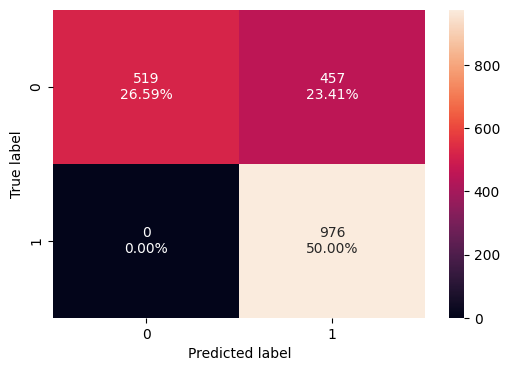

In [ ]:
confusion_matrix_sklearn(xboost_un, X_train_un, y_train_un)

#### Summary - XGBoost Tuning on Under Sampled data

This model returned a perfect Recall Score on Training and Validation data, but the accuracy and precicion were extremely low as a result.  To see if we can get a more balanced model, will change the learning_rate from 0.01 to 0.05.  


The XGBoost model prioritizes recall (1.0), meaning it catches all actual churners (True Positives). This is excellent for avoiding False Negatives (missing churners).

However, the low precision on validation dataset (0.274) indicates a high number of False Positives (predicting churn where it didn't happen). This can be misleading and lead to wasted resources if you're targeting these customers with retention efforts.

Targeting False Positives with retention efforts wastes resources that could be better spent on customers who are more likely to churn (True Positives).



#### Re-run XG Boost with Learning rate = 0.05

In [ ]:
# rerun xgboost tuned with learning_rate = 0.05
xboost_un2 = XGBClassifier(random_state=1, eval_metric='logloss', gamma=3, learning_rate=0.05, n_estimators=50, scale_pos_weight=5, subsample=0.7)

xboost_un2.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=3, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

In [ ]:
xboost_train_un2 = model_performance_classification_sklearn(xboost_un2, X_train_un, y_train_un)
xboost_train_un2

,Accuracy,Recall,Precision,F1
0,0.951,1.000,0.910,0.953


In [ ]:
xboost_train_un2.insert(loc=0, column='Model', value="XB_Tuned_Under 0.05")

In [ ]:
xboost_train_un2

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_Under 0.05,0.951,1.000,0.910,0.953


In [ ]:
xboost_val_un2 = model_performance_classification_sklearn(xboost_un2, X_val, y_val)
xboost_val_un2

,Accuracy,Recall,Precision,F1
0,0.856,0.994,0.528,0.689


In [ ]:
xboost_val_un2.insert(loc=0, column='Model', value="XB_Tuned_Val_Under 0.05")

In [ ]:
xboost_val_un2

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_Val_Under 0.05,0.856,0.994,0.528,0.689


In [ ]:
xgboost_tuned_under_0_05 = classificationResultsDF("", xboost_train_un2, xboost_val_un2, metricList = ["Recall", "F1"])
xgboost_tuned_under_0_05

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,XB_Tuned_Under 0.05,1.000,0.994,0.006,0.953,0.689,0.264


#### Summary - XGBoost Tuning - Under Sampled - Learning Rate = 0.05

After adjusting the Learing Rate the Accuracy, Precision and F1 metrics all improved.  

The Validation Recall still remains high at 0.994, suggesting it still captures most actual churners (True Positives).

Precision has improved significantly to 0.53. While not perfect, it's almost double the previous value. This means the model is less likely to identify non-churners (False Positives) as churners.

The F1-score increased to 0.692, reflecting the better balance between precision and recall.


## Model Comparison and Final Model Selection

#### Model Performance Analysis:

Our analysis revealed interesting insights regarding model performance on the original and under-sampled datasets:

**AdaBoost**: Under-sampling the data significantly improved recall scores for AdaBoost on both training and validation sets. This suggests the model benefits from addressing class imbalance. However, we'll also consider AdaBoost with the original data due to its lower difference between train and validation scores (potentially indicating better generalization).

**Gradient Boosting**: Similar to AdaBoost, under-sampling led to a noticeable increase in recall scores for Gradient Boosting on both datasets. While the difference between train and validation scores increased slightly, it remained comparable to the original model. This suggests under-sampling benefits Gradient Boosting as well.

**XGBoost**: Using under-sampled data with XGBoost yielded the highest training recall (1.0) and a very good validation recall (0.994).


In [ ]:
# Concat best models

#finalModels = pd.concat([ada_train_un, ada_val_un, grad_train_un ,grad_val_un, xboost_train_un2, xboost_val_un2 ], axis=0, ignore_index=True)

finalModels = pd.concat([ada_tuned_under, grad_tuned_under, xgboost_tuned_under_0_01 ,xgboost_tuned_under_0_05 ], axis=0, ignore_index=True)

### Final Metrics for Top 3 Models

In [ ]:
finalModels

,Model,Recall Train,Recall Val,Recall_Diff,F1 Train,F1 Val,F1 Diff
0,Ada_Tuned_Under,0.984,0.954,0.030,0.979,0.798,0.181
1,Grad_Tuned_Under,0.981,0.957,0.024,0.977,0.821,0.156
2,XB_Tuned_Under,1.000,1.000,0.000,0.810,0.432,0.379
3,XB_Tuned_Under 0.05,1.000,0.994,0.006,0.953,0.689,0.264


### Evaulate Test Dataset XGBoost Model
The top model based on Recall score on training and validation datasets is XG Boost with undersampled data.


### Test Set final performance

#### XG Boost Undersampled on Test dataset

In [ ]:
xgb_test_under = model_performance_classification_sklearn(xboost_un2, X_test, y_test)
xgb_test_under

,Accuracy,Recall,Precision,F1
0,0.866,0.988,0.546,0.703


In [ ]:
#Insert model name column
xgb_test_under.insert(loc=0, column='Model', value="XB_Tuned_0_05_Test_Under")


In [ ]:
xgb_test_under

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_0_05_Test_Under,0.866,0.988,0.546,0.703


In [ ]:
# concat all xgboost metrics, train, val and test
final_xgboost = pd.concat([xboost_train_un2, xboost_val_un2, xgb_test_under], axis=0)


#### Metrics for XG Boost Model on Train, Val and Test sets

In [ ]:
final_xgboost

,Model,Accuracy,Recall,Precision,F1
0,XB_Tuned_Under 0.05,0.951,1.000,0.910,0.953
0,XB_Tuned_Val_Under 0.05,0.856,0.994,0.528,0.689
0,XB_Tuned_0_05_Test_Under,0.866,0.988,0.546,0.703


### Best Model Performance Results


**Undersampling:** Undersampling the majority class (likely non-churners) helped address potential class imbalance and improve the model's ability to generalize to unseen data.


**Learning Rate Impact:** A learning rate of 0.05 achieved a good balance between recall and other metrics like precision and F1-score.

**High Recall, Low Precision (Learning Rate 0.01):** While achieving a perfect recall (1.0) on both training and validation data with a learning rate of 0.01 seems ideal, it led to very low precision (0.274) on the validation dataset. This means the model identified all actual churners (True Positives) but also predicted churn for many non-churners (False Positives). Targeting these False Positives with retention efforts would be a waste of resources.


**Balanced Model (Learning Rate 0.05):** Increasing the learning rate to 0.05 resulted in a more balanced model. It maintained a high training recall (1.0) and a close validation recall (0.994).

This model also performed well on unseen test data with a recall of 0.985 and significant improvements in accuracy (0.858), precision (0.530), and F1-score (0.692).


**Feature Importance:**

Our exploration of feature importances, measured by their weight in the model's predictions, reveals valuable insights into the key drivers of the model's behavior.

**Dominant Feature:** Total_Trans_Ct (Total Transaction Count) emerges as the most influential factor, with a weight of 0.311, significantly higher than any other feature. This suggests that the overall transaction activity in the past year has the strongest impact on the model's predictions.

**Financial Activity Significance:** Features like Total_Trans_Amt (Total Transaction Amount) and changes in transaction counts and amounts across quarters (Total_Ct_Chng_Q4_Q1, Total_Amt_Chng_Q4_Q1) also hold considerable importance. This indicates that the model considers both the overall financial activity and its trends over time.

**Customer Relationship:** Total_Relationship_Count (Total Products Held)  suggests that the number of products a customer has with the company influences the model's predictions to a moderate degree.

**Credit Usage:** The presence of Total_Revolving_Bal (Total Revolving Balance) among the top features implies that the model incorporates credit card usage into its decision-making, although its impact is less significant compared to transaction activity.

Overall, these findings provide a roadmap for understanding the model's behavior. The model heavily relies on past transaction activity and financial trends, along with customer product holdings and credit card usage, with transaction activity having the strongest influence.


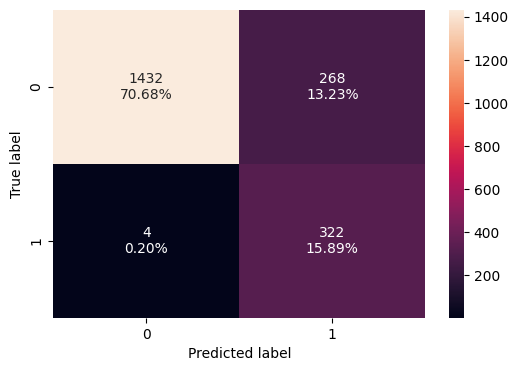

In [ ]:
confusion_matrix_sklearn(xboost_un2, X_test, y_test)


In [ ]:
# List of features and importance values for xboost_un

importances = xboost_un.feature_importances_
features = X_train_un.columns

feature_importances = pd.Series(importances, features).sort_values(ascending=False)

print(feature_importances)


Total_Trans_Ct                   0.307
Total_Trans_Amt                  0.128
Total_Revolving_Bal              0.066
Total_Ct_Chng_Q4_Q1              0.049
Total_Relationship_Count         0.044
Months_Inactive_12_mon           0.041
Total_Amt_Chng_Q4_Q1             0.040
Card_Category_Platinum           0.038
Marital_Status_Married           0.027
Avg_Open_To_Buy                  0.027
Credit_Limit                     0.025
Avg_Utilization_Ratio            0.025
Contacts_Count_12_mon            0.021
Income_Category_$60K - $80K      0.020
Education_Level_Graduate         0.020
Marital_Status_Single            0.019
Customer_Age                     0.016
Income_Category_Unknown          0.015
Income_Category_$80K - $120K     0.014
Months_on_book                   0.014
Dependent_count                  0.012
Income_Category_$40K - $60K      0.011
Gender_M                         0.010
Income_Category_Less than $40K   0.007
Education_Level_Uneducated       0.006
Card_Category_Gold       

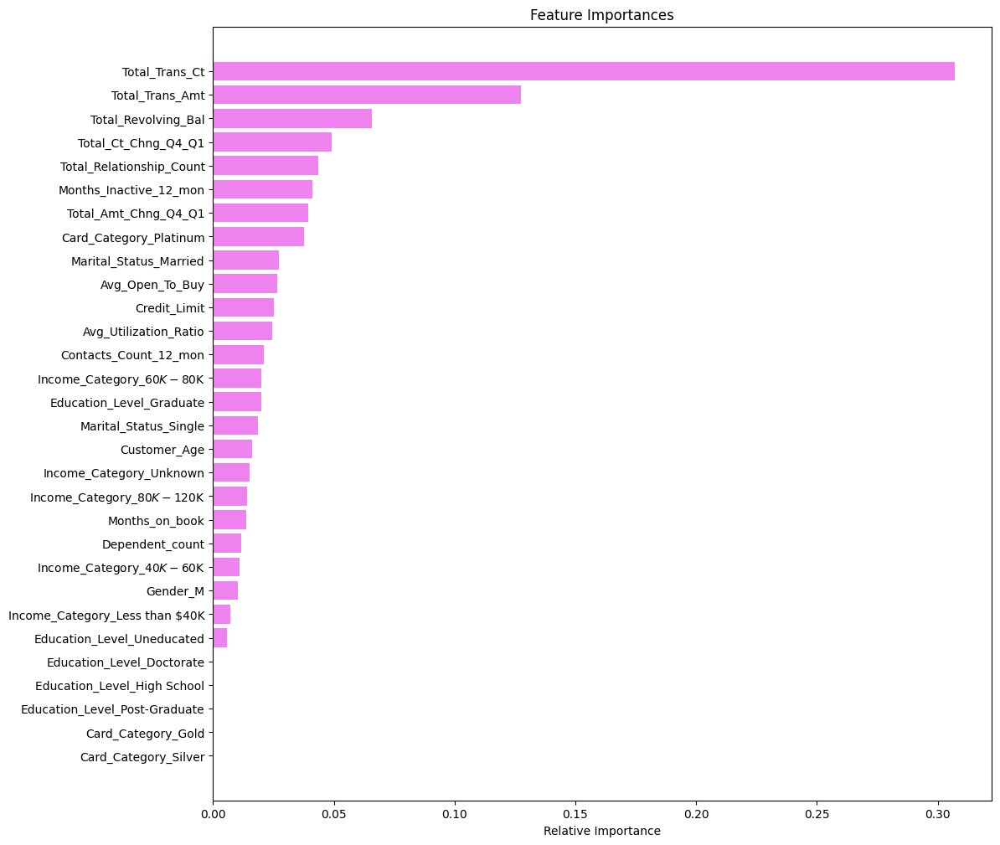

In [ ]:
# Barh plot of feature importances

feature_names = X_train.columns
importances = xboost_un.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

# Business Insights and Conclusions

***

This analysis uncovers key factors influencing customer attrition and provides actionable insights for improving customer retention:

**Customer Satisfaction & Activity:**

  - High customer contact frequency indicates potential dissatisfaction leading to attrition. Investigate reasons for frequent contact and address them proactively.
      
  - Both very active and inactive customers have a higher attrition rate. Encourage moderate engagement and identify reasons for inactivity.

**Account Features:**

  - Customers with more products churn less. Offer targeted product recommendations based on customer profiles to increase product penetration.

**Card Type:**

Platinum cards have the highest attrition rate. Investigate factors driving churn among Platinum cardholders and develop targeted retention strategies.

**Demographics:**

  - Females and highly educated customers show higher churn.
  - Analyze reasons for churn within these segments and tailor retention efforts accordingly.

**Model Performance:**

  - XGBoost with undersampling achieved high recall (0.985) on test data, indicating effectiveness in identifying potential churners.

**Feature Importance:**

  - Transaction activity (total count, amount, and changes) is the strongest predictor of attrition.
  
  - Focus retention efforts on customers with uncharacteristic transaction activity.

**Business Recommendations:**

1.  **Targeted Retention Programs:** Design personalized retention programs based on customer segments and churn risk factors identified above.

2.   **Early Intervention:** Proactively address potential dissatisfaction by analyzing reasons for frequent customer contact.

3.  **Engagement Strategies:** Encourage moderate account activity through targeted promotions and personalized communications.

4.  **Product Cross-Selling:** Upsell or recommend additional products to customers with low product penetration to increase customer lifetime value.

5.  **Investigate Platinum Card Churn:** Analyze reasons for higher attrition among Platinum cardholders and develop targeted strategies to address them.

**Additional Considerations:**

- Explore the reasons behind the dominance of Blue cards with a low attrition rate (potentially a past marketing campaign). Leverage these insights for future campaigns.

- Investigate the small segment of customers who churned despite having a high income (potentially high expectations). Tailor communication and offerings for this segment.

